# Deep Convolutional GAN (DCGAN)

In [157]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for testing purposes, please do not change!


def show_tensor_images(image_tensor, num_images=1, size=(3, 100, 100)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in an uniform grid.
    '''
    image_tensor = (image_tensor + 1) / 2
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:num_images], nrow=1)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

In [158]:
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_chan: the number of channels in the images, fitted for the dataset used, a scalar
              (MNIST is black-and-white, so 1 channel is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_chan=3, hidden_dim=64):
        super(Generator, self).__init__()
        self.z_dim = z_dim
        # Build the neural network
        self.gen = nn.Sequential(
            self.make_gen_block(z_dim, hidden_dim * 4),
            self.make_gen_block(hidden_dim * 4, hidden_dim * 2, kernel_size=4, stride=1),
            self.make_gen_block(hidden_dim * 2, hidden_dim),
            self.make_gen_block(hidden_dim, im_chan, kernel_size=4, final_layer=True),
        )

    def make_gen_block(self, input_channels, output_channels, kernel_size=3, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a generator block of DCGAN, 
        corresponding to a transposed convolution, a batchnorm (except for in the last layer), and an activation.
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''

        if not final_layer:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.ReLU(),
            )
        else: # Final Layer
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.Tanh(),
            )

    def unsqueeze_noise(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns a copy of that noise with width and height = 1 and channels = z_dim.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        return noise.view(len(noise), self.z_dim, 1, 1)

    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        x = self.unsqueeze_noise(noise)
        return self.gen(x)

def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim)
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    '''
    return torch.randn(n_samples, z_dim, device=device)

In [159]:
# UNQx_C2 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
'''
Test your make_gen_block() function
'''
gen = Generator()
num_test = 100

# Test the hidden block
test_hidden_noise = get_noise(num_test, gen.z_dim)
test_hidden_block = gen.make_gen_block(10, 20, kernel_size=4, stride=1)
test_uns_noise = gen.unsqueeze_noise(test_hidden_noise)
hidden_output = test_hidden_block(test_uns_noise)

# Check that it works with other strides
test_hidden_block_stride = gen.make_gen_block(20, 20, kernel_size=4, stride=2)

test_final_noise = get_noise(num_test, gen.z_dim) * 20
test_final_block = gen.make_gen_block(10, 20, final_layer=True)
test_final_uns_noise = gen.unsqueeze_noise(test_final_noise)
final_output = test_final_block(test_final_uns_noise)

# Test the whole thing:
test_gen_noise = get_noise(num_test, gen.z_dim)
test_uns_gen_noise = gen.unsqueeze_noise(test_gen_noise)
gen_output = gen(test_uns_gen_noise)

In [160]:
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
        im_chan: the number of channels in the images, fitted for the dataset used, a scalar
              (MNIST is black-and-white, so 1 channel is your default)
    hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_chan=3, hidden_dim=16):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            self.make_disc_block(im_chan, hidden_dim),
            self.make_disc_block(hidden_dim, hidden_dim * 2),
            self.make_disc_block(hidden_dim * 2, 3, final_layer=True),
        )

    def make_disc_block(self, input_channels, output_channels, kernel_size=4, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a discriminator block of DCGAN, 
        corresponding to a convolution, a batchnorm (except for in the last layer), and an activation.
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''
        
        # Build the neural block
        if not final_layer:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.LeakyReLU(0.2),
            )
        else: # Final Layer
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
            )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_dim)
        '''
        disc_pred = self.disc(image)
        return disc_pred.view(len(disc_pred), -1)

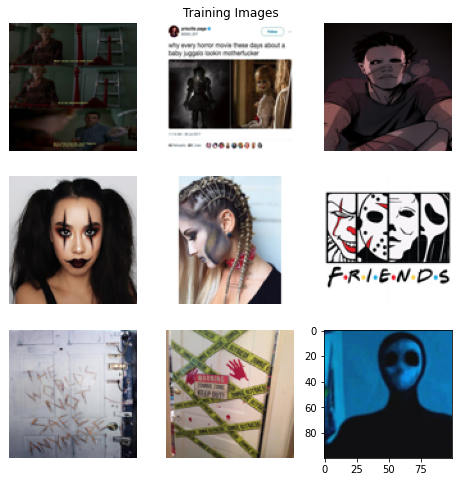

In [161]:
import numpy as np

# plot images in a nxn grid
 
def plot_images(imgs, grid_size = 5):
    """
    imgs: vector containing all the numpy images
    grid_size: 2x2 or 5x5 grid containing images
    """
     
    fig = plt.figure(figsize = (8, 8))
    columns = rows = grid_size
    plt.title("Training Images")
 
    for i in range(1, columns*rows +1):
        plt.axis("off")
        fig.add_subplot(rows, columns, i)
        plt.imshow(imgs[i])
    plt.show()
# load the numpy vector containing image representations
imgs = np.load('../input/100x100-horror/images_100x100.npz')
 
# pls ignore the poor quality of the images as we are working with 32x32 sized images.
plot_images(imgs['arr_0'], 3)

In [162]:
from torch.utils.data import Dataset

class HorrorDataset(Dataset):
    """Human Faces dataset."""
 
    def __init__(self, npz_imgs):
        """
        Args:
            npz_imgs (string): npz file with all the images (created in gan.ipynb)
        """
        self.imgs = npz_imgs
 
    def __len__(self):
        return len(self.imgs)
 
    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()
 
        image = self.imgs[idx]
 
        return image

In [163]:
criterion = nn.BCEWithLogitsLoss()
z_dim = 64
display_step = 500
batch_size = 128
# A learning rate of 0.0002 works well on DCGAN
lr = 0.0002

# These parameters control the optimizer's momentum, which you can read more about here:
# https://distill.pub/2017/momentum/ but you don’t need to worry about it for this course!
beta_1 = 0.5 
beta_2 = 0.999
device = 'cuda'

# You can tranform the image values to be between -1 and 1 (the range of the tanh activation)
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,)),
])

transpose_imgs = np.transpose( # imp step to convert image size from (7312, 32,32,3) to (7312, 3,32,32)
    np.float32(imgs['arr_0']), # imp step to convert double -&gt; float (by default numpy input uses double as data type)
    (0, 3,1,2) # tuple to describe how to rearrange the dimensions
    ) 
 
dset = HorrorDataset(transpose_imgs) # passing the npz variable to the constructor class
batch_size = 2
shuffle = True
 
dataloader = DataLoader(dataset = dset, batch_size = batch_size, shuffle = shuffle)
print(len(dset))


988


In [164]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr, betas=(beta_1, beta_2))
disc = Discriminator().to(device) 
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr, betas=(beta_1, beta_2))

# You initialize the weights to the normal distribution
# with mean 0 and standard deviation 0.02
def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)
gen = gen.apply(weights_init)
disc = disc.apply(weights_init)

  0%|          | 0/494 [00:00<?, ?it/s]

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 1, step 500: Generator loss: 0.6866223684549327, discriminator loss: 0.6848349682092659


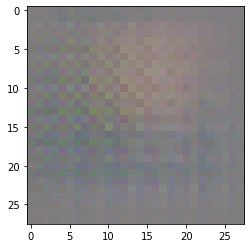

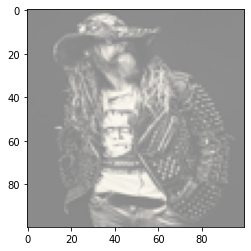

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 2, step 1000: Generator loss: 0.7008214482069022, discriminator loss: 0.6915799561738978


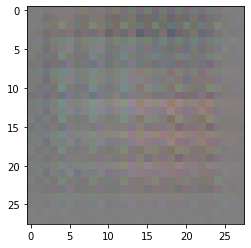

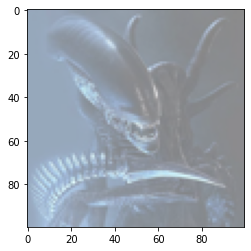

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 3, step 1500: Generator loss: 0.700483336925507, discriminator loss: 0.685830850005149


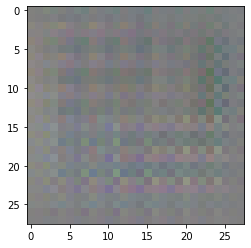

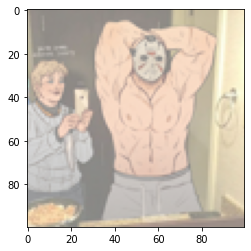

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 4, step 2000: Generator loss: 0.7086995090246199, discriminator loss: 0.6937622359991071


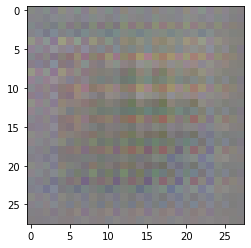

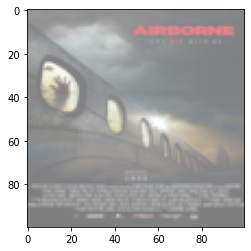

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 5, step 2500: Generator loss: 0.7058971428871154, discriminator loss: 0.6938502125740044


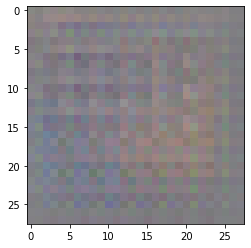

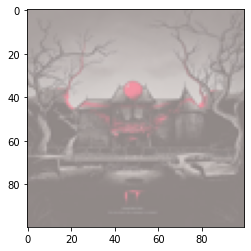

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 6, step 3000: Generator loss: 0.7113930498361588, discriminator loss: 0.6878257570266731


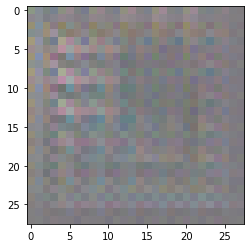

Exception ignored in: <function tqdm.__del__ at 0x7f9afd01b560>
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/tqdm/std.py", line 1162, in __del__
    self.close()
  File "/opt/conda/lib/python3.7/site-packages/tqdm/notebook.py", line 287, in close
    self.disp(bar_style='danger', check_delay=False)
AttributeError: 'tqdm' object has no attribute 'disp'


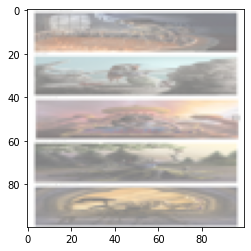

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 7, step 3500: Generator loss: 0.7135085474252705, discriminator loss: 0.6909821115732194


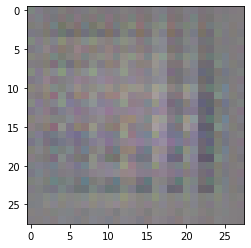

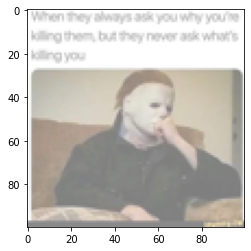

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 8, step 4000: Generator loss: 0.724214259028435, discriminator loss: 0.683674368262291


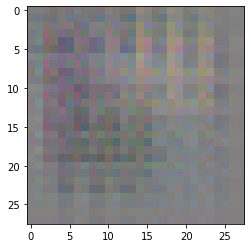

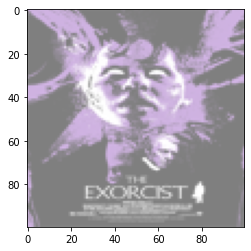

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 9, step 4500: Generator loss: 0.7106152257919306, discriminator loss: 0.693811174035072


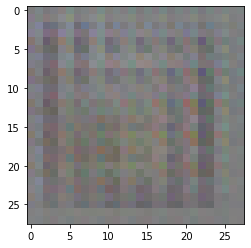

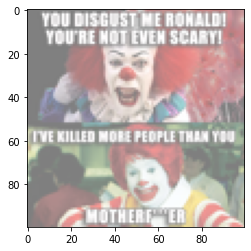

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 10, step 5000: Generator loss: 0.7081315574645999, discriminator loss: 0.6956363227367396


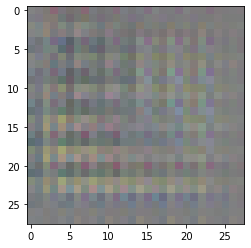

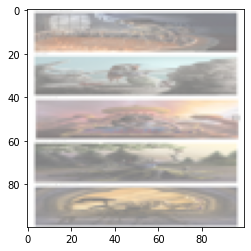

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 11, step 5500: Generator loss: 0.7241491241455079, discriminator loss: 0.6887485709190369


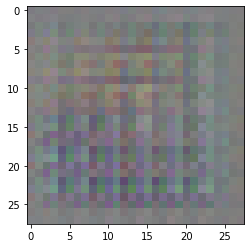

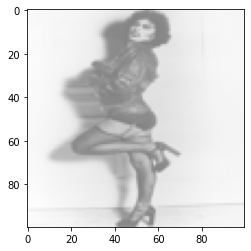

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 12, step 6000: Generator loss: 0.7056004637479785, discriminator loss: 0.700910949707031


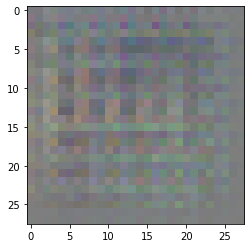

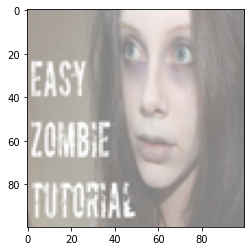

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 13, step 6500: Generator loss: 0.7210355931520461, discriminator loss: 0.6850281770229338


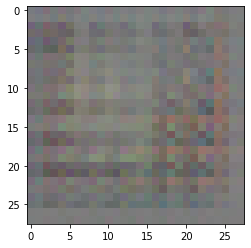

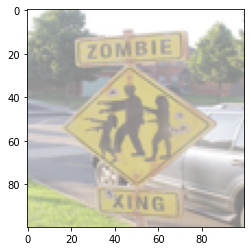

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 14, step 7000: Generator loss: 0.7112319574356089, discriminator loss: 0.6875531191825869


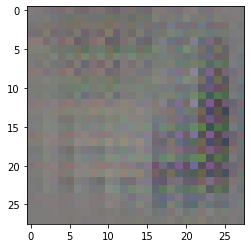

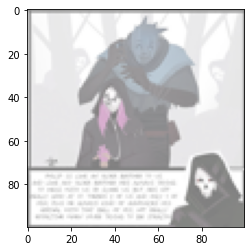

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 15, step 7500: Generator loss: 0.7187931622862805, discriminator loss: 0.686282400488853


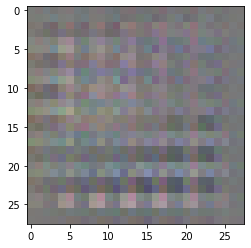

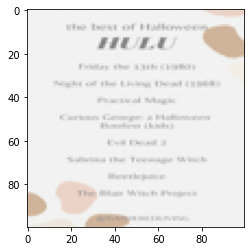

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 16, step 8000: Generator loss: 0.7183730624914172, discriminator loss: 0.6935122966766367


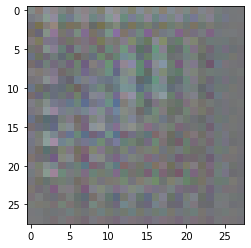

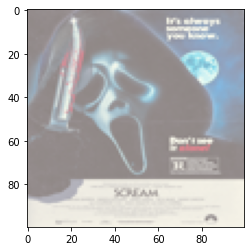

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 17, step 8500: Generator loss: 0.7225116516351701, discriminator loss: 0.6753513901233675


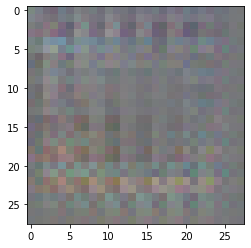

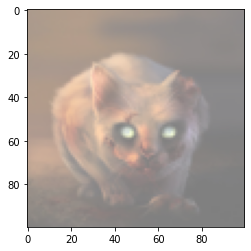

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 18, step 9000: Generator loss: 0.7136697450876233, discriminator loss: 0.700142471194267


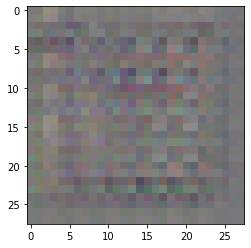

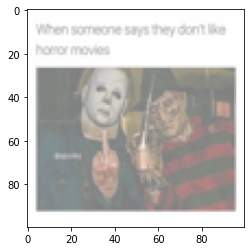

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 19, step 9500: Generator loss: 0.7228421187400815, discriminator loss: 0.6896569825410841


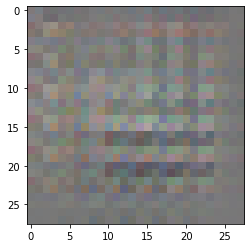

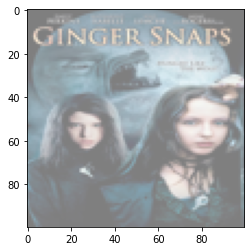

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 20, step 10000: Generator loss: 0.7142980184555056, discriminator loss: 0.6958238509893412


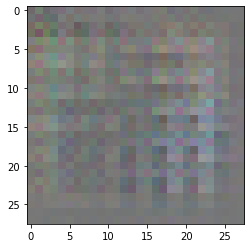

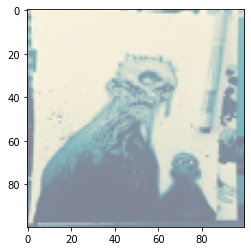

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 21, step 10500: Generator loss: 0.7158973516225818, discriminator loss: 0.6932270593643187


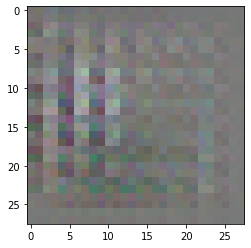

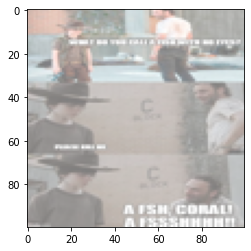

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 22, step 11000: Generator loss: 0.7295615061521527, discriminator loss: 0.6852478576898582


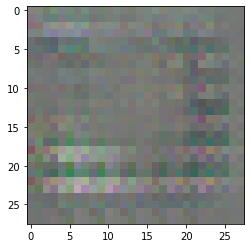

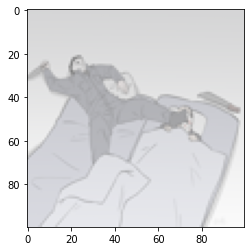

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 23, step 11500: Generator loss: 0.7307187286615373, discriminator loss: 0.681886140465737


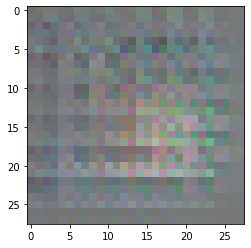

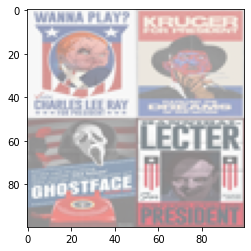

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 24, step 12000: Generator loss: 0.7243931710720057, discriminator loss: 0.6976118975877756


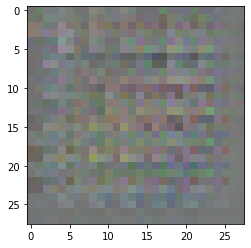

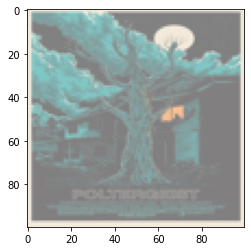

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 25, step 12500: Generator loss: 0.74308215546608, discriminator loss: 0.6792261852025989


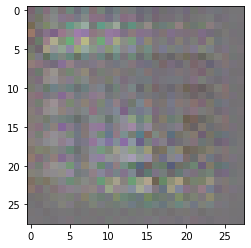

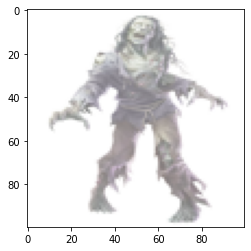

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 26, step 13000: Generator loss: 0.729738151609898, discriminator loss: 0.6880710419416425


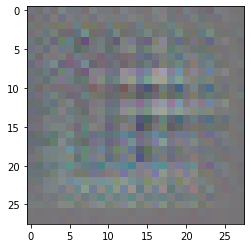

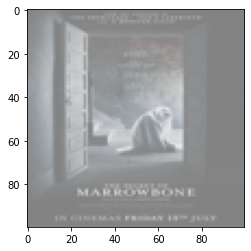

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 27, step 13500: Generator loss: 0.7331602762937541, discriminator loss: 0.6841631118059156


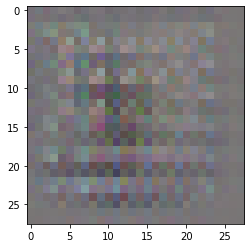

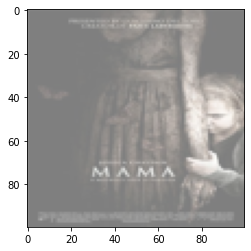

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 28, step 14000: Generator loss: 0.7263469390869141, discriminator loss: 0.6957519153356551


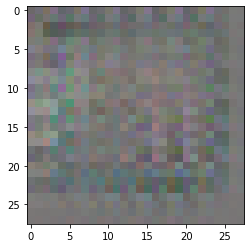

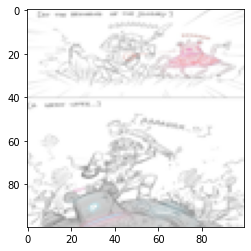

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 29, step 14500: Generator loss: 0.7336527304649352, discriminator loss: 0.6805103335380557


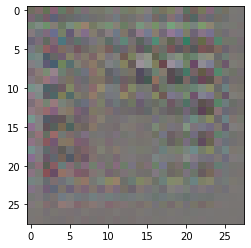

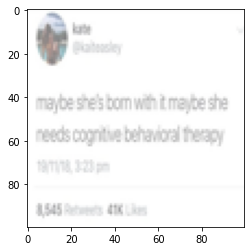

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 30, step 15000: Generator loss: 0.7415900746583939, discriminator loss: 0.6897124223709109


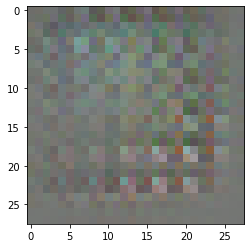

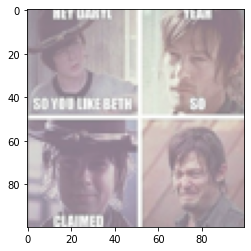

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 31, step 15500: Generator loss: 0.731201356649399, discriminator loss: 0.6916689465045928


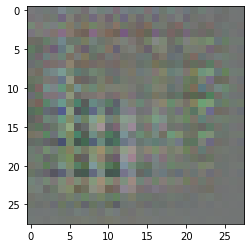

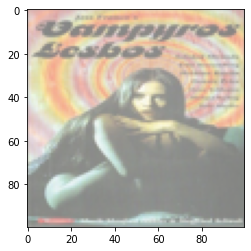

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 32, step 16000: Generator loss: 0.7442574652433395, discriminator loss: 0.6817632740736008


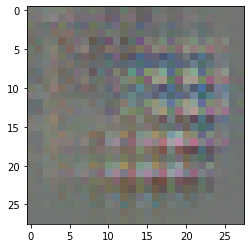

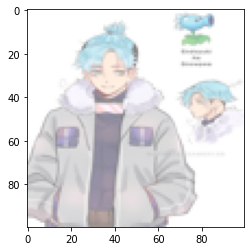

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 33, step 16500: Generator loss: 0.7438604865074159, discriminator loss: 0.6843767585754394


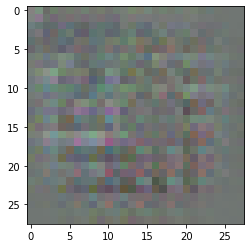

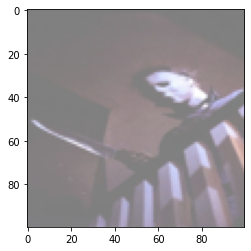

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 34, step 17000: Generator loss: 0.7460258873701094, discriminator loss: 0.6864621852636338


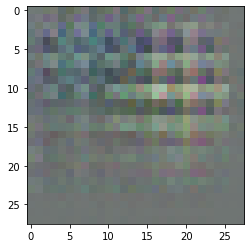

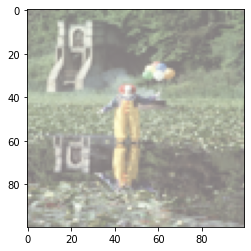

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 35, step 17500: Generator loss: 0.7331742739677432, discriminator loss: 0.6950478912591931


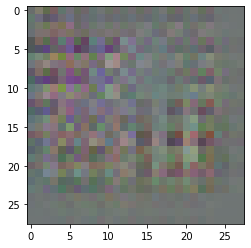

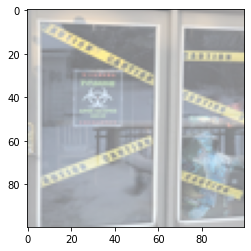

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 36, step 18000: Generator loss: 0.7472158597111702, discriminator loss: 0.676402489185333


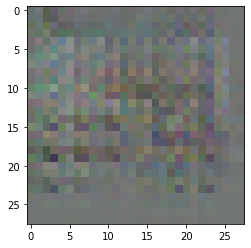

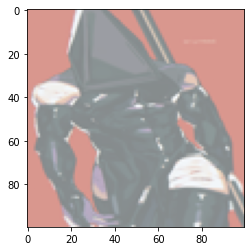

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 37, step 18500: Generator loss: 0.758246255636215, discriminator loss: 0.678706375002861


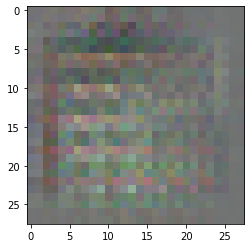

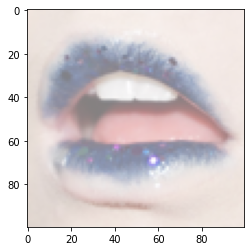

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 38, step 19000: Generator loss: 0.752371006846428, discriminator loss: 0.6896531788110737


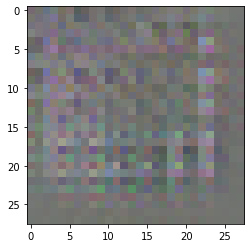

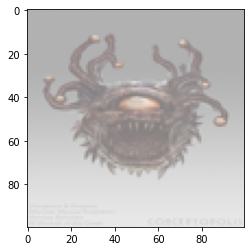

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 39, step 19500: Generator loss: 0.7753413127660757, discriminator loss: 0.6645576399564744


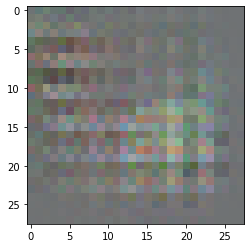

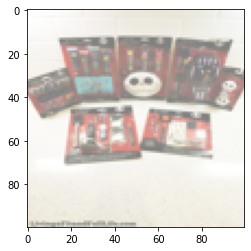

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 40, step 20000: Generator loss: 0.7746939505338666, discriminator loss: 0.6742419499158859


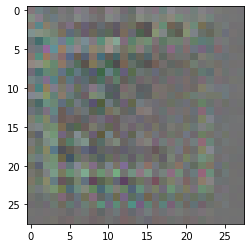

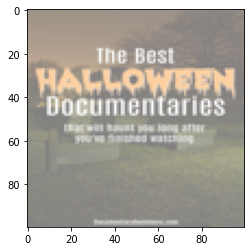

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 41, step 20500: Generator loss: 0.761527025938033, discriminator loss: 0.6936918493509295


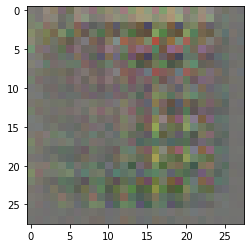

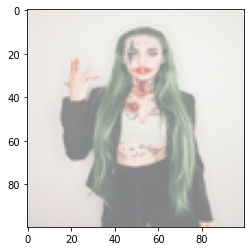

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 42, step 21000: Generator loss: 0.7619885333776479, discriminator loss: 0.6841785169839864


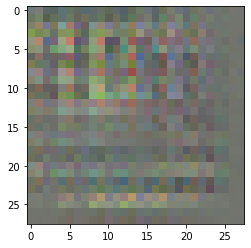

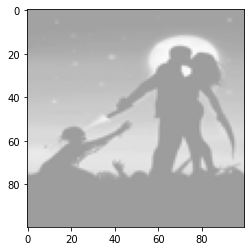

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 43, step 21500: Generator loss: 0.7776055206060412, discriminator loss: 0.674006906867028


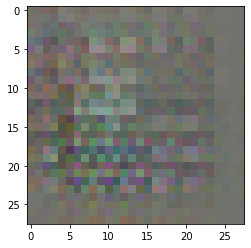

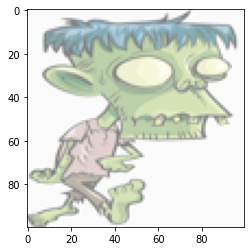

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 44, step 22000: Generator loss: 0.7948131692409514, discriminator loss: 0.667681891202927


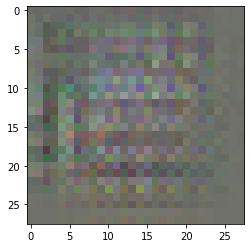

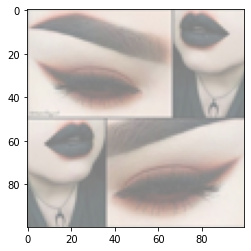

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 45, step 22500: Generator loss: 0.7830939050912858, discriminator loss: 0.6870466364622115


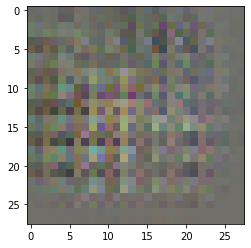

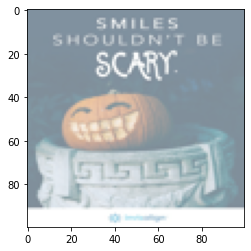

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 46, step 23000: Generator loss: 0.7520628649592408, discriminator loss: 0.6929697982072828


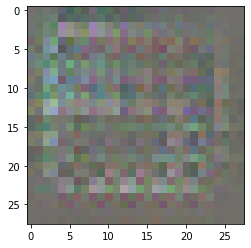

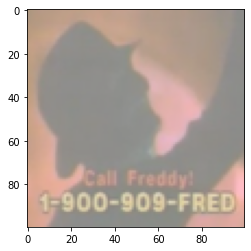

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 47, step 23500: Generator loss: 0.7911441177129745, discriminator loss: 0.6615643202066424


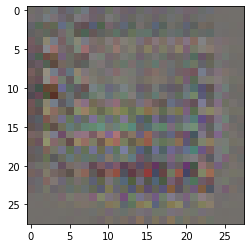

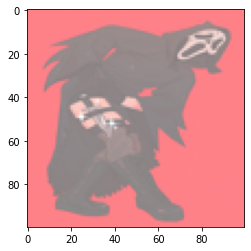

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 48, step 24000: Generator loss: 0.8083878453969957, discriminator loss: 0.6559426357746124


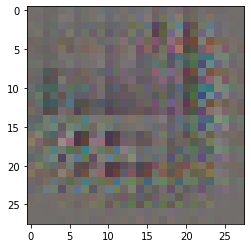

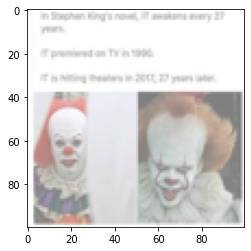

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 49, step 24500: Generator loss: 0.8197358057498929, discriminator loss: 0.6513090887069696


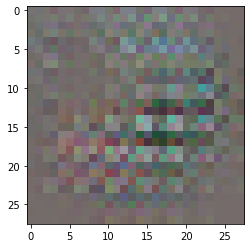

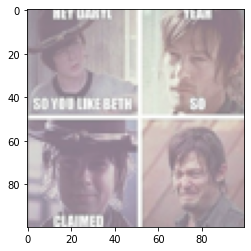

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 50, step 25000: Generator loss: 0.8111796673536302, discriminator loss: 0.6724426668882371


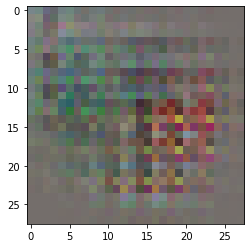

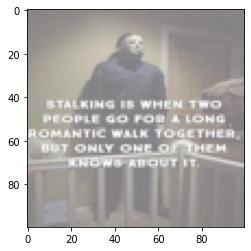

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 51, step 25500: Generator loss: 0.8068894792199144, discriminator loss: 0.6887406699061401


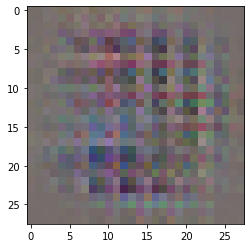

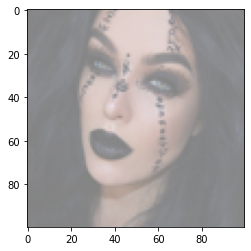

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 52, step 26000: Generator loss: 0.8017443754673007, discriminator loss: 0.6779652067422872


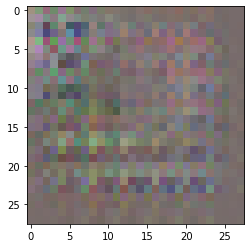

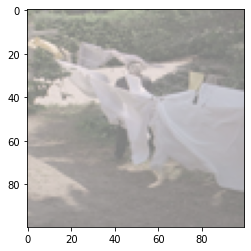

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 53, step 26500: Generator loss: 0.8045662170648572, discriminator loss: 0.672552782058716


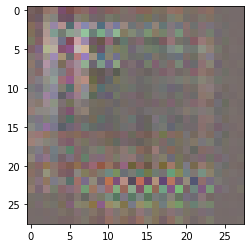

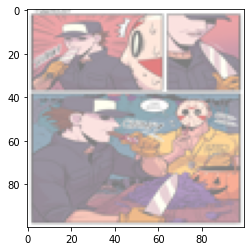

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 54, step 27000: Generator loss: 0.827135837435722, discriminator loss: 0.6473775337934495


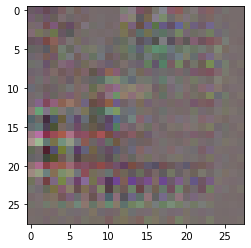

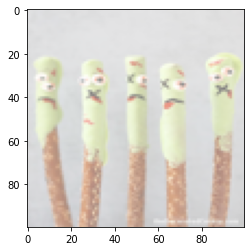

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 55, step 27500: Generator loss: 0.8324572263956066, discriminator loss: 0.6441980843544011


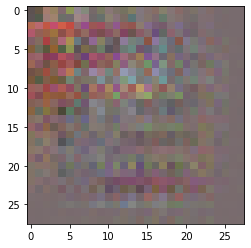

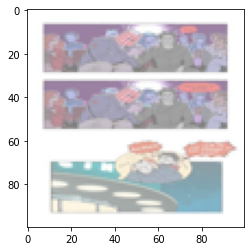

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 56, step 28000: Generator loss: 0.8654684848785398, discriminator loss: 0.6310735745429985


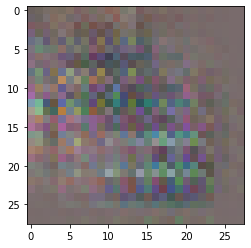

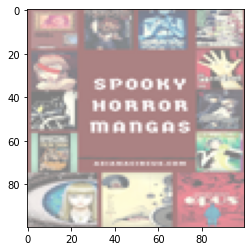

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 57, step 28500: Generator loss: 0.8830528109073652, discriminator loss: 0.6301470571160317


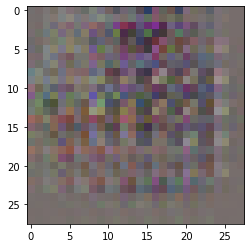

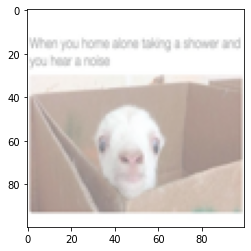

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 58, step 29000: Generator loss: 0.912300776839257, discriminator loss: 0.6020866644382472


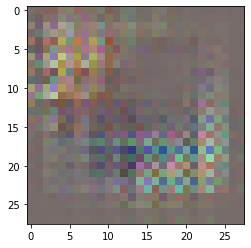

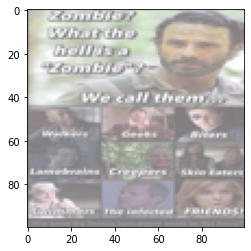

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 59, step 29500: Generator loss: 0.9256270356178286, discriminator loss: 0.6118023113012311


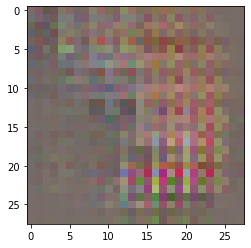

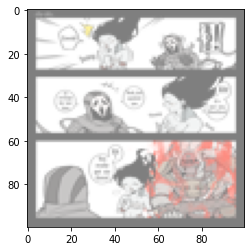

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 60, step 30000: Generator loss: 0.9337539286613465, discriminator loss: 0.6119523218274114


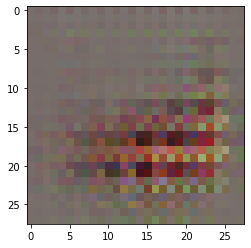

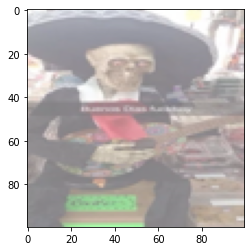

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 61, step 30500: Generator loss: 0.8250884729623801, discriminator loss: 0.6933477631807328


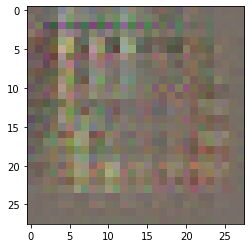

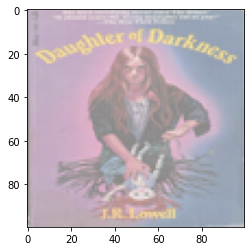

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 62, step 31000: Generator loss: 0.9420039148330687, discriminator loss: 0.5678096583485605


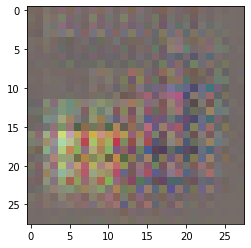

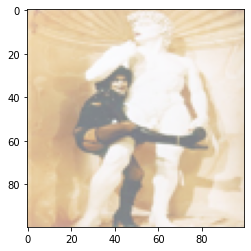

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 63, step 31500: Generator loss: 0.9397833946943284, discriminator loss: 0.6464121659994125


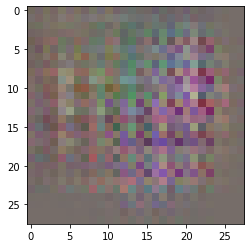

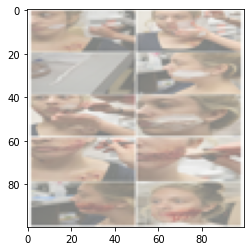

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 64, step 32000: Generator loss: 0.9525503412485125, discriminator loss: 0.6207781862020485


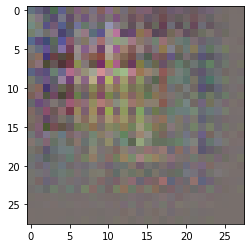

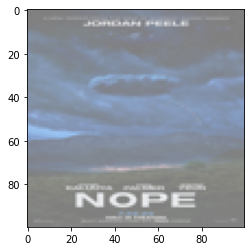

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 65, step 32500: Generator loss: 0.902089962661267, discriminator loss: 0.6389866828322407


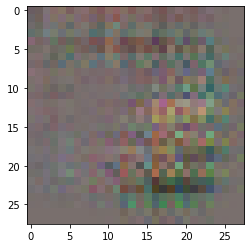

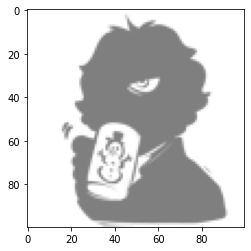

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 66, step 33000: Generator loss: 0.9220232746005068, discriminator loss: 0.6039978625178338


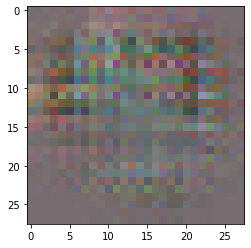

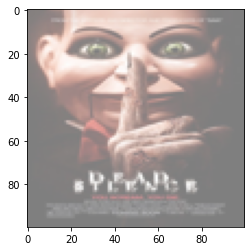

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 67, step 33500: Generator loss: 0.9590689833164218, discriminator loss: 0.621290084958076


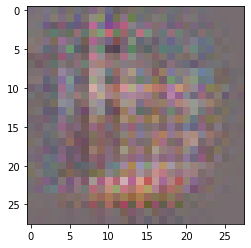

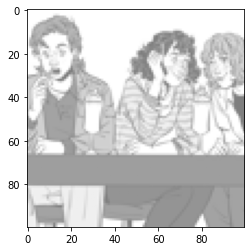

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 68, step 34000: Generator loss: 1.0403389582633968, discriminator loss: 0.5303135952949526


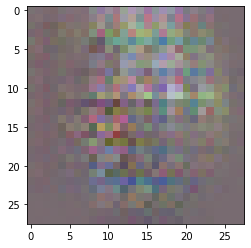

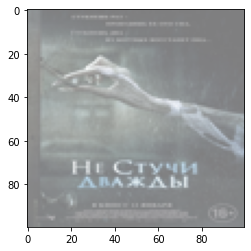

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 69, step 34500: Generator loss: 1.0320267477035525, discriminator loss: 0.5910399823188781


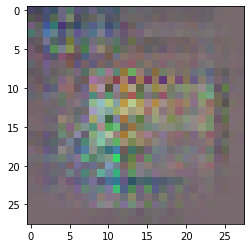

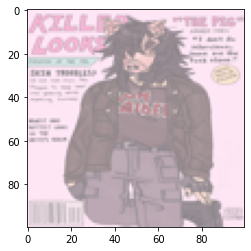

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 70, step 35000: Generator loss: 0.9921408681869509, discriminator loss: 0.5999671766757966


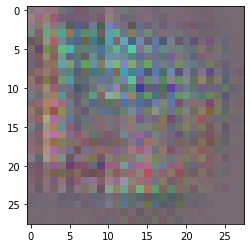

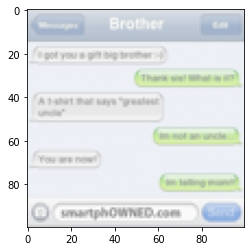

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 71, step 35500: Generator loss: 1.0197162721157078, discriminator loss: 0.5619573128819463


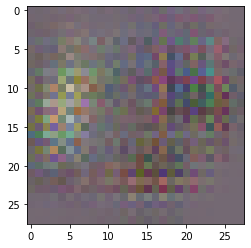

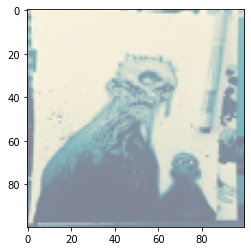

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 72, step 36000: Generator loss: 0.9806952019631865, discriminator loss: 0.6399272700548175


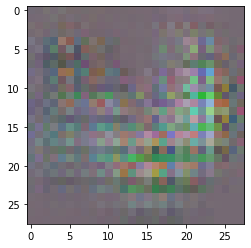

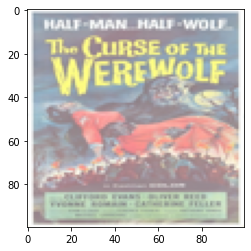

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 73, step 36500: Generator loss: 1.0247819554209705, discriminator loss: 0.5998611185550695


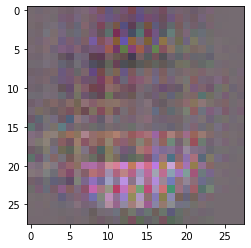

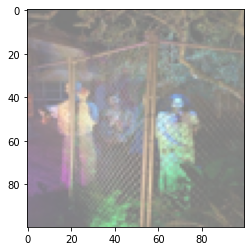

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 74, step 37000: Generator loss: 1.008361958384514, discriminator loss: 0.6035199736952778


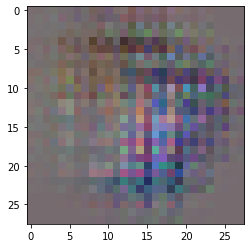

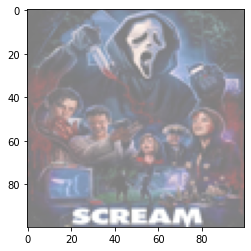

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 75, step 37500: Generator loss: 1.1076611236929899, discriminator loss: 0.5408270766735074


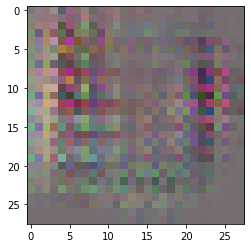

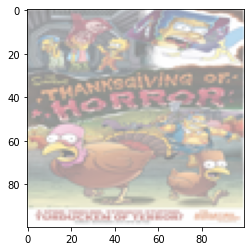

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 76, step 38000: Generator loss: 1.0800424093008043, discriminator loss: 0.5594868601560592


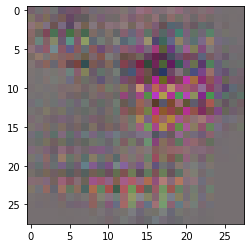

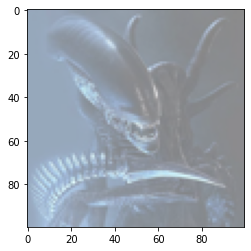

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 77, step 38500: Generator loss: 1.0461765582561484, discriminator loss: 0.5976472632288929


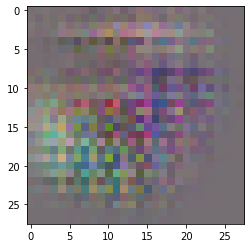

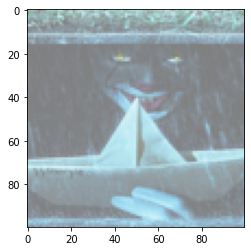

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 78, step 39000: Generator loss: 1.0716285221576687, discriminator loss: 0.6055888978242879


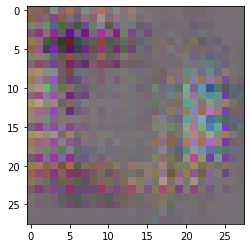

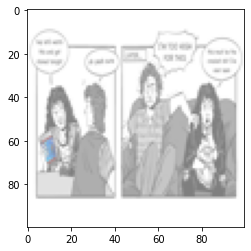

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 79, step 39500: Generator loss: 1.0779261893033982, discriminator loss: 0.6085530538558958


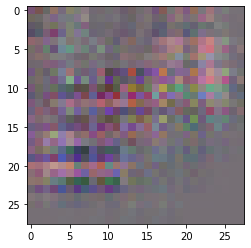

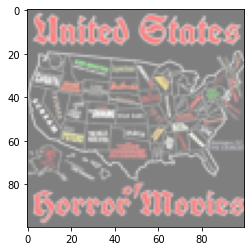

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 80, step 40000: Generator loss: 0.9989627474546433, discriminator loss: 0.617070327043533


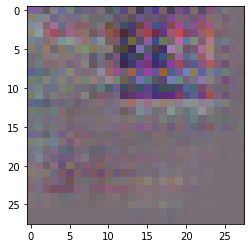

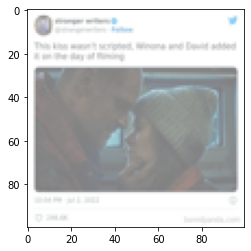

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 81, step 40500: Generator loss: 1.0148750391006474, discriminator loss: 0.579046283185482


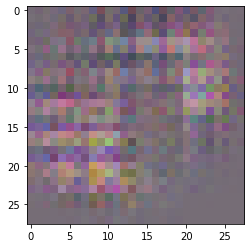

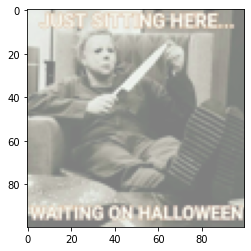

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 82, step 41000: Generator loss: 1.058059211969375, discriminator loss: 0.5821215109229092


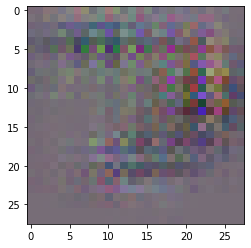

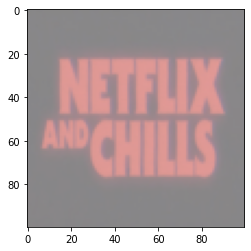

  0%|          | 0/494 [00:00<?, ?it/s]

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 84, step 41500: Generator loss: 1.0341517613530158, discriminator loss: 0.5903395656347278


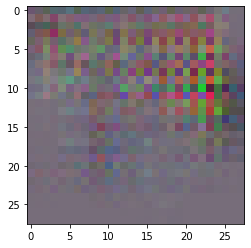

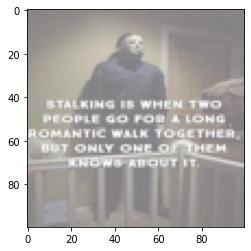

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 85, step 42000: Generator loss: 1.1066152173280728, discriminator loss: 0.5630612846016889


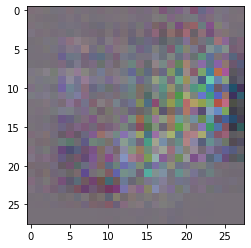

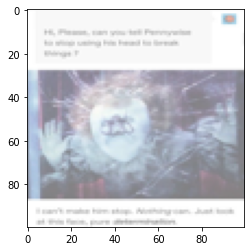

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 86, step 42500: Generator loss: 1.0448407969474796, discriminator loss: 0.5820239943265915


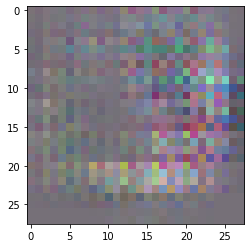

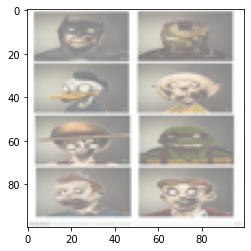

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 87, step 43000: Generator loss: 1.008761400461197, discriminator loss: 0.5701871932148938


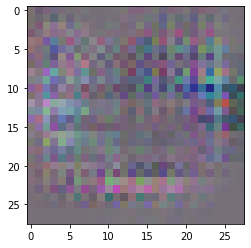

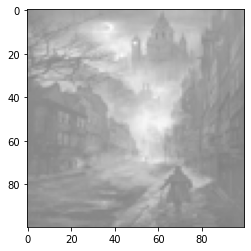

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 88, step 43500: Generator loss: 1.084396915018559, discriminator loss: 0.5560000149607658


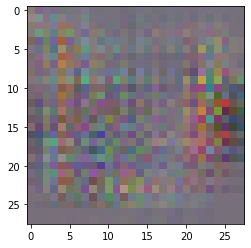

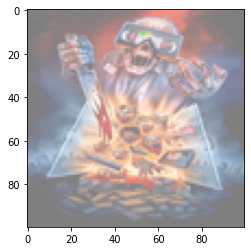

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 89, step 44000: Generator loss: 1.147235705316067, discriminator loss: 0.5525338485240934


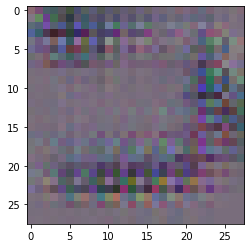

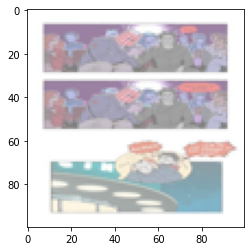

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 90, step 44500: Generator loss: 1.1060101990103721, discriminator loss: 0.5378538102507593


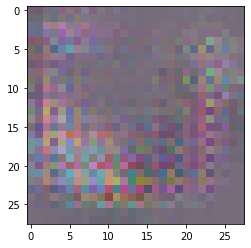

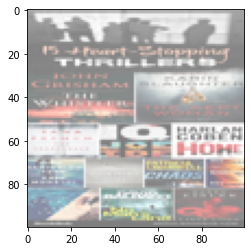

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 91, step 45000: Generator loss: 1.294749092131854, discriminator loss: 0.47957256719470004


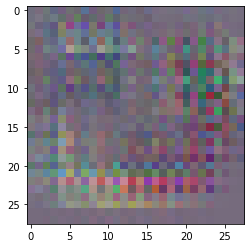

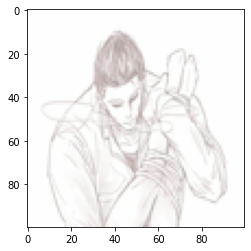

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 92, step 45500: Generator loss: 1.2534380363225937, discriminator loss: 0.539122329652309


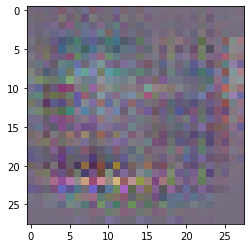

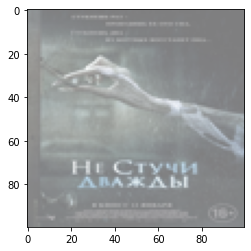

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 93, step 46000: Generator loss: 1.1600800833702074, discriminator loss: 0.5106072694063187


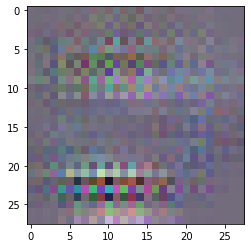

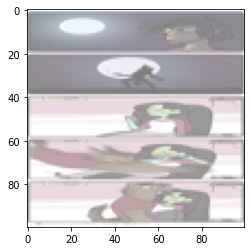

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 94, step 46500: Generator loss: 1.147870567679404, discriminator loss: 0.5406518644094466


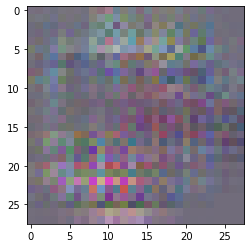

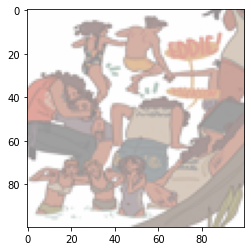

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 95, step 47000: Generator loss: 1.165830430746078, discriminator loss: 0.5200944284200668


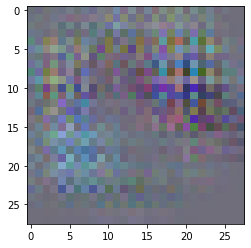

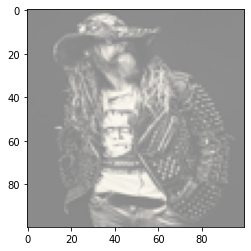

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 96, step 47500: Generator loss: 1.1678892998695356, discriminator loss: 0.5451613178849226


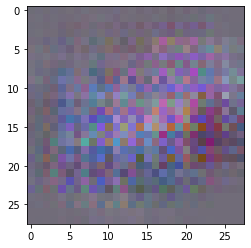

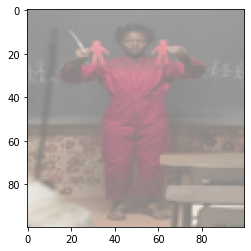

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 97, step 48000: Generator loss: 1.3071796361207968, discriminator loss: 0.5374350978732108


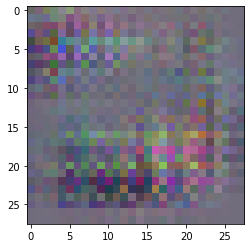

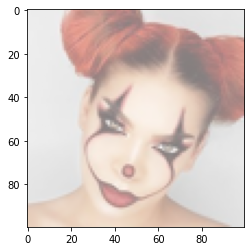

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 98, step 48500: Generator loss: 1.2993910771608357, discriminator loss: 0.5042371035218233


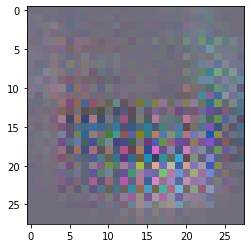

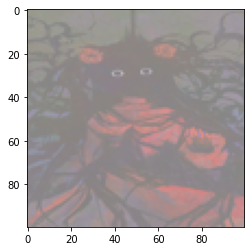

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 99, step 49000: Generator loss: 1.342269648551941, discriminator loss: 0.4704637314677237


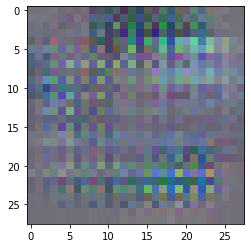

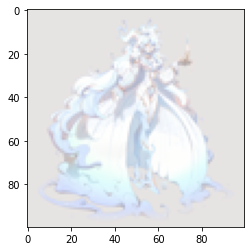

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 100, step 49500: Generator loss: 1.3146919617652892, discriminator loss: 0.4514929903149613


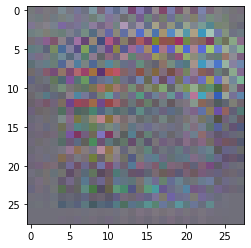

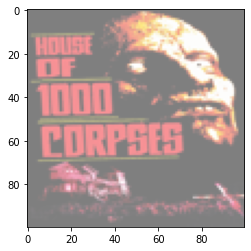

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 101, step 50000: Generator loss: 1.1830570355653771, discriminator loss: 0.5242453848123548


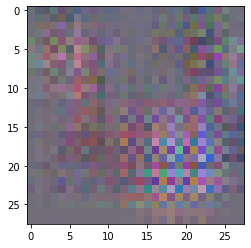

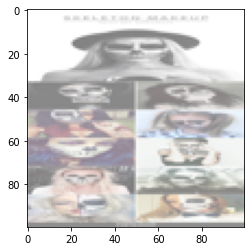

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 102, step 50500: Generator loss: 1.3797874544858935, discriminator loss: 0.43642758837342205


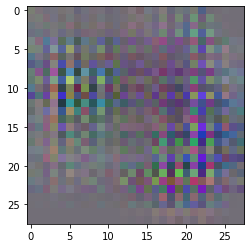

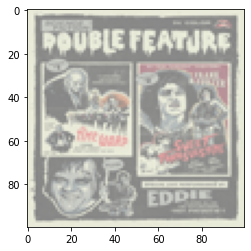

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 103, step 51000: Generator loss: 1.4043806946277615, discriminator loss: 0.4976216844022275


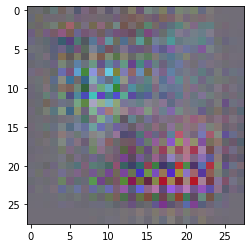

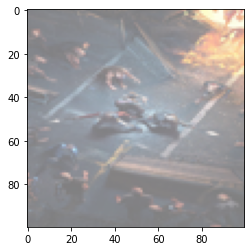

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 104, step 51500: Generator loss: 1.464587129712104, discriminator loss: 0.4439148675501342


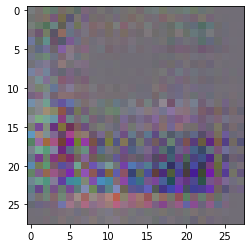

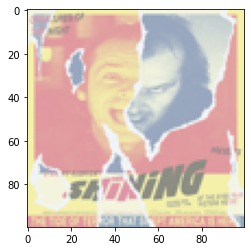

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 105, step 52000: Generator loss: 1.5273847693800926, discriminator loss: 0.5008454717695714


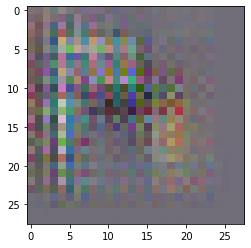

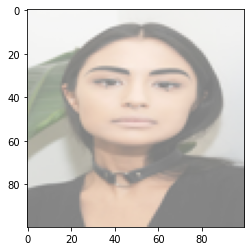

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 106, step 52500: Generator loss: 1.581057614147662, discriminator loss: 0.46167530778050425


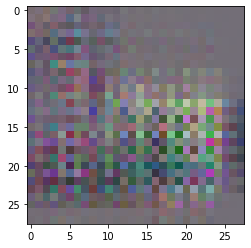

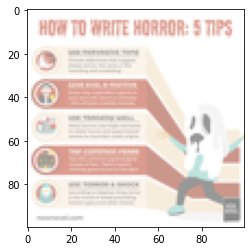

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 107, step 53000: Generator loss: 1.4154601992368703, discriminator loss: 0.45542942655086527


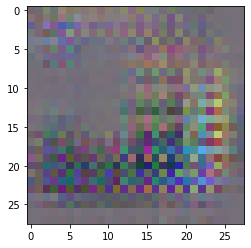

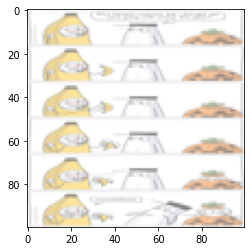

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 108, step 53500: Generator loss: 1.5023668123483647, discriminator loss: 0.41955349180102364


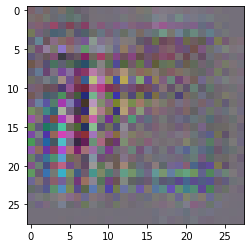

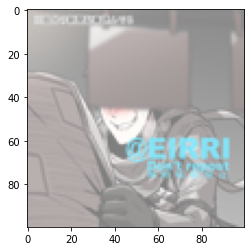

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 109, step 54000: Generator loss: 1.4873073590993873, discriminator loss: 0.4471920806467532


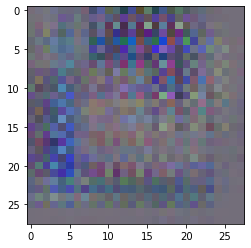

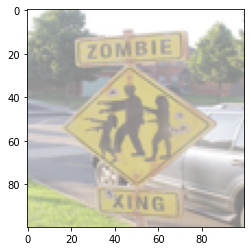

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 110, step 54500: Generator loss: 1.3932284535765638, discriminator loss: 0.5160871268808837


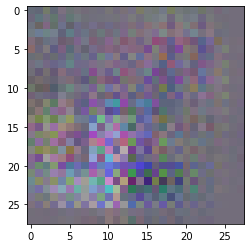

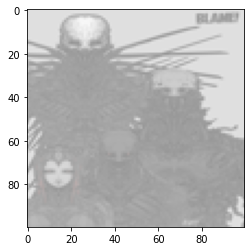

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 111, step 55000: Generator loss: 1.6040342016220102, discriminator loss: 0.4077510660588742


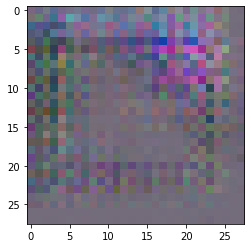

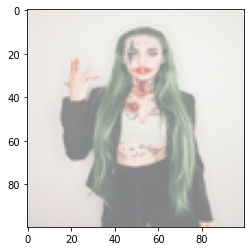

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 112, step 55500: Generator loss: 1.5093386789560312, discriminator loss: 0.4398440202772615


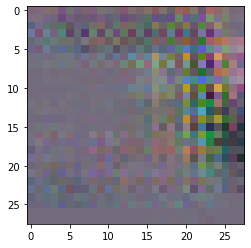

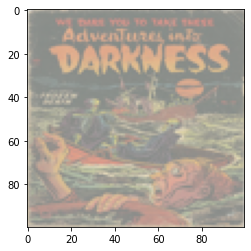

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 113, step 56000: Generator loss: 1.5969457638263702, discriminator loss: 0.4100508650243281


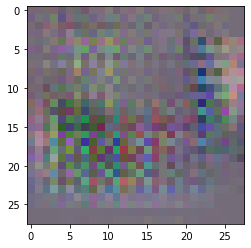

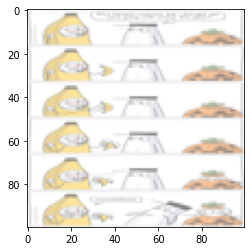

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 114, step 56500: Generator loss: 1.6245570989847182, discriminator loss: 0.4237282145619394


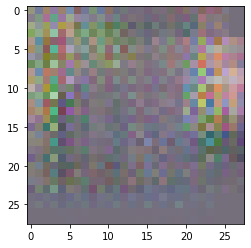

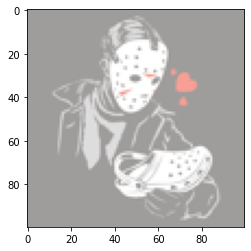

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 115, step 57000: Generator loss: 1.3989583200812339, discriminator loss: 0.499246422022581


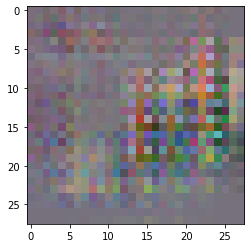

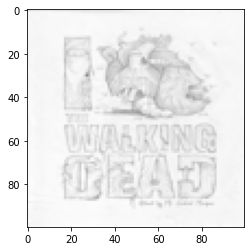

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 116, step 57500: Generator loss: 1.4214244841933246, discriminator loss: 0.5102504948675635


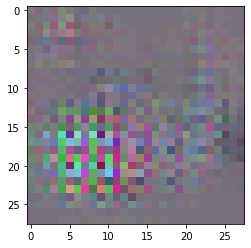

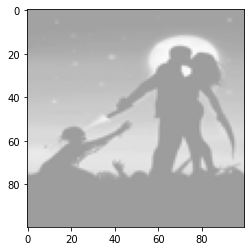

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 117, step 58000: Generator loss: 1.3443416177332395, discriminator loss: 0.5804307655692097


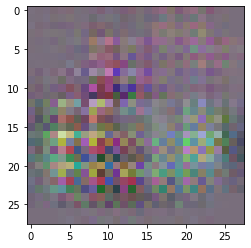

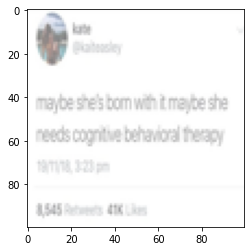

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 118, step 58500: Generator loss: 1.3748635858297353, discriminator loss: 0.4958684970736505


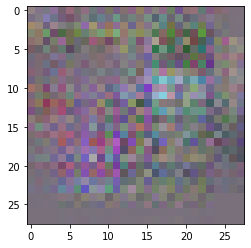

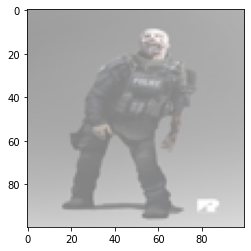

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 119, step 59000: Generator loss: 1.5670747315883629, discriminator loss: 0.42937551459670065


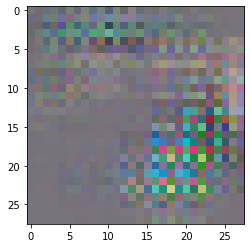

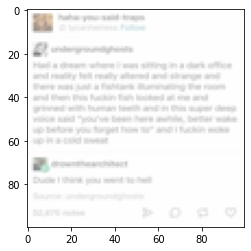

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 120, step 59500: Generator loss: 1.5119221457242955, discriminator loss: 0.4355127310454852


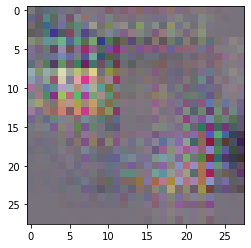

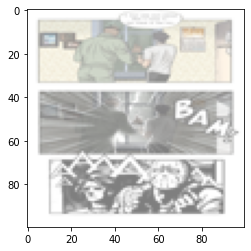

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 121, step 60000: Generator loss: 1.3915391604900376, discriminator loss: 0.4734416576921946


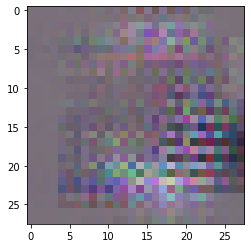

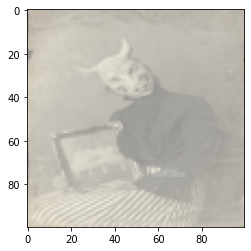

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 122, step 60500: Generator loss: 1.5940515447855002, discriminator loss: 0.43556173250079144


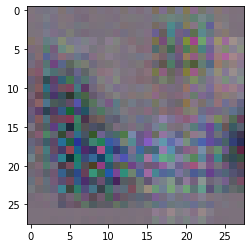

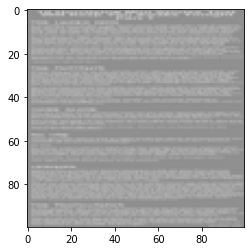

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 123, step 61000: Generator loss: 1.6023118252754207, discriminator loss: 0.41178304749727246


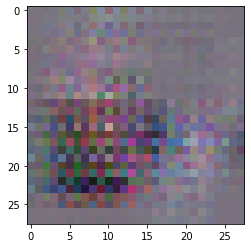

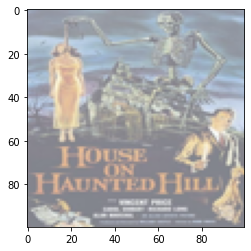

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 124, step 61500: Generator loss: 1.4519505407810225, discriminator loss: 0.44316905522346484


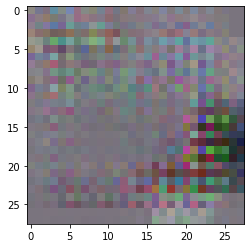

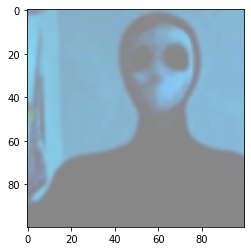

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 125, step 62000: Generator loss: 1.6555578548908239, discriminator loss: 0.3847102881073952


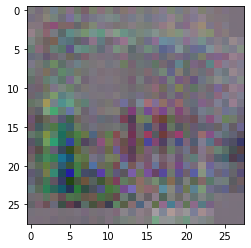

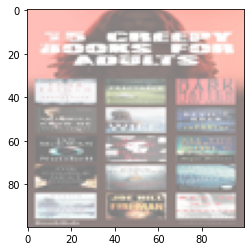

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 126, step 62500: Generator loss: 1.618145316123963, discriminator loss: 0.41258679226040884


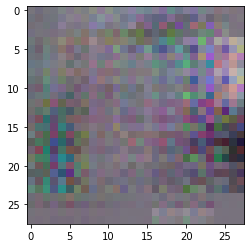

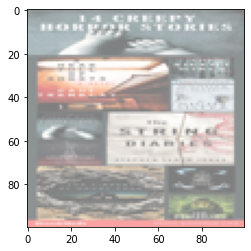

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 127, step 63000: Generator loss: 1.7531569067239756, discriminator loss: 0.3327652710825202


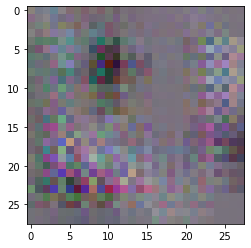

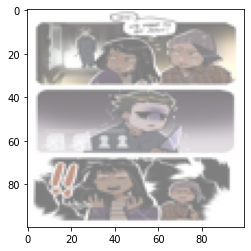

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 128, step 63500: Generator loss: 1.747478202819823, discriminator loss: 0.35000544279813744


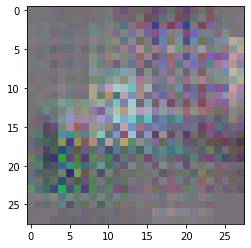

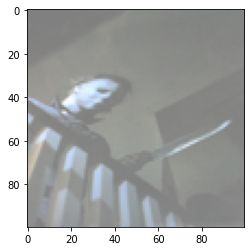

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 129, step 64000: Generator loss: 1.7553225976228706, discriminator loss: 0.3799192245602607


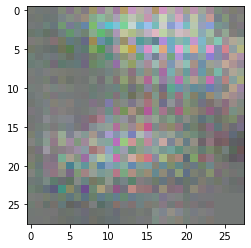

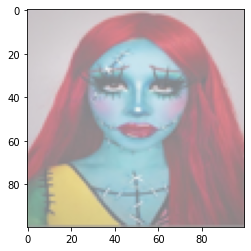

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 130, step 64500: Generator loss: 1.9982004411220533, discriminator loss: 0.31237801782786845


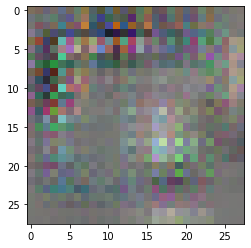

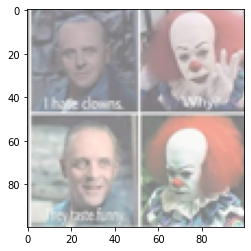

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 131, step 65000: Generator loss: 1.8220373156070713, discriminator loss: 0.35880603572726283


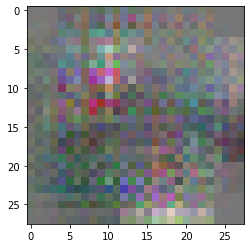

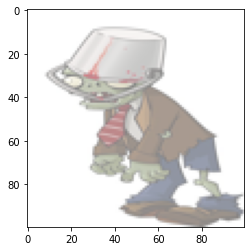

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 132, step 65500: Generator loss: 1.7808122262954724, discriminator loss: 0.372680932402611


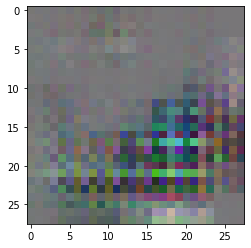

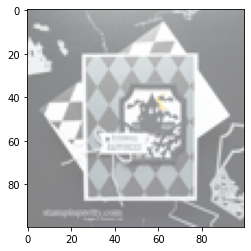

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 133, step 66000: Generator loss: 1.8980456361770621, discriminator loss: 0.33611278288066376


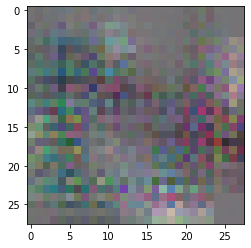

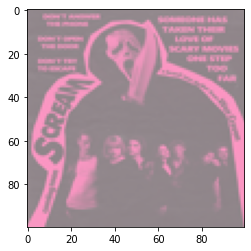

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 134, step 66500: Generator loss: 1.7766986317634583, discriminator loss: 0.36022597198188283


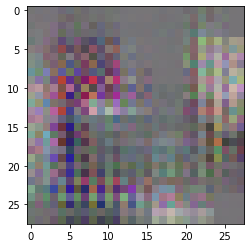

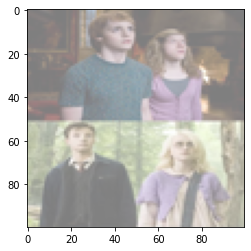

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 135, step 67000: Generator loss: 1.9313638452291484, discriminator loss: 0.3128853632062673


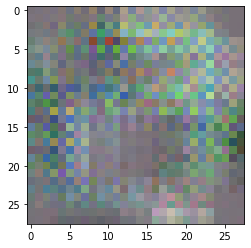

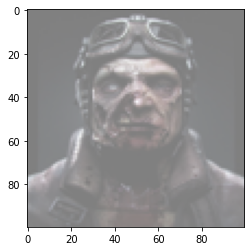

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 136, step 67500: Generator loss: 1.9778208527564995, discriminator loss: 0.3241181422621011


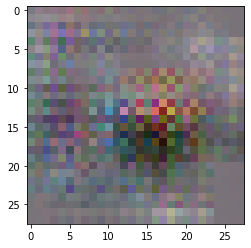

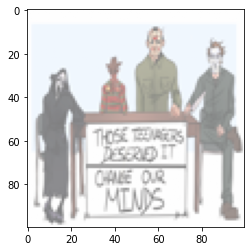

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 137, step 68000: Generator loss: 1.8938139013648028, discriminator loss: 0.3470950729846953


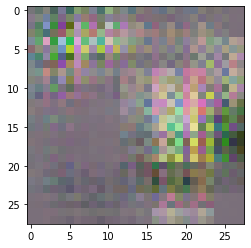

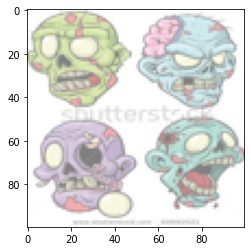

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 138, step 68500: Generator loss: 1.9770961886644354, discriminator loss: 0.3455169342905285


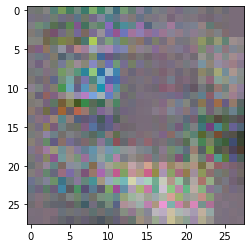

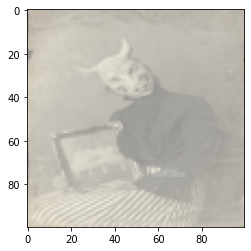

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 139, step 69000: Generator loss: 1.8536086773872382, discriminator loss: 0.3383144459277392


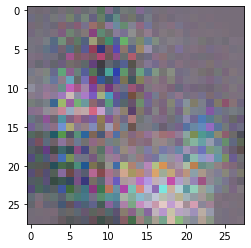

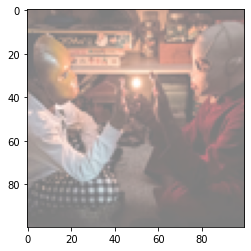

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 140, step 69500: Generator loss: 2.004580634355545, discriminator loss: 0.33951125644892444


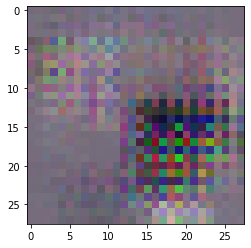

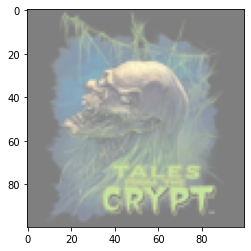

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 141, step 70000: Generator loss: 1.7661783828735336, discriminator loss: 0.4027701667845249


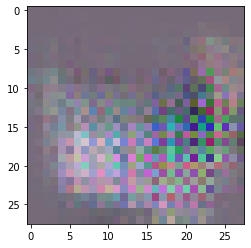

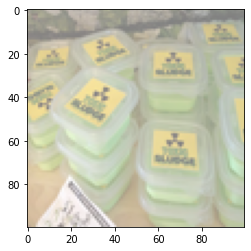

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 142, step 70500: Generator loss: 1.9111107300519945, discriminator loss: 0.3470376709252597


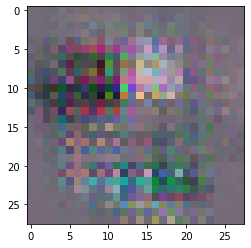

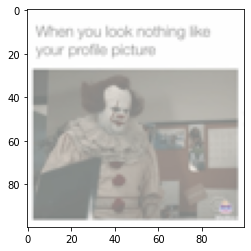

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 143, step 71000: Generator loss: 1.7915261164903635, discriminator loss: 0.34740067696571325


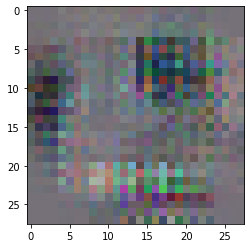

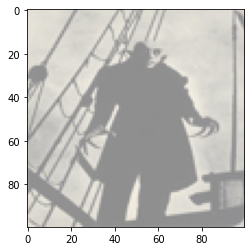

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 144, step 71500: Generator loss: 2.115883437156676, discriminator loss: 0.320917484253645


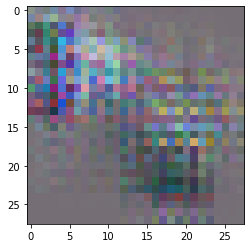

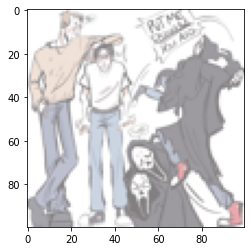

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 145, step 72000: Generator loss: 1.9677146397829062, discriminator loss: 0.401258080676198


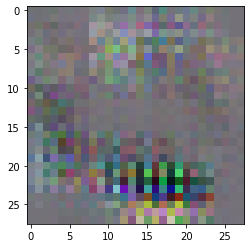

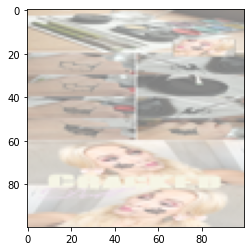

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 146, step 72500: Generator loss: 1.819624234557151, discriminator loss: 0.39908907181024517


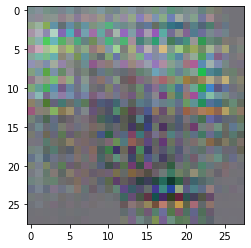

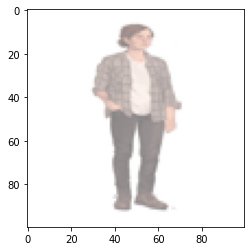

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 147, step 73000: Generator loss: 1.866774329662323, discriminator loss: 0.458236387103796


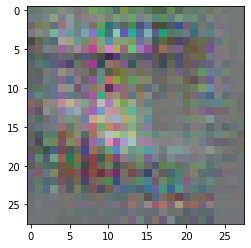

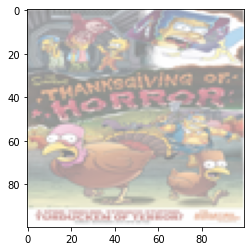

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 148, step 73500: Generator loss: 1.7368136962652192, discriminator loss: 0.4157349877357481


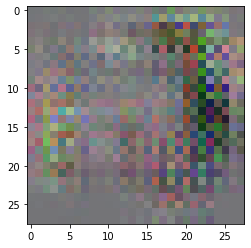

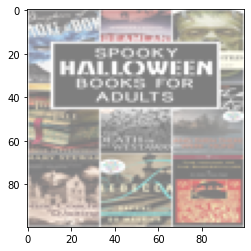

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 149, step 74000: Generator loss: 1.8557437856197347, discriminator loss: 0.38581971070170407


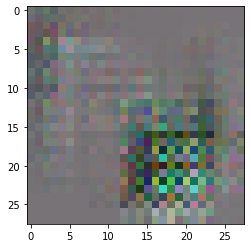

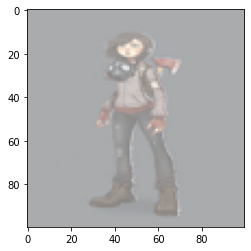

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 150, step 74500: Generator loss: 1.9226421036124237, discriminator loss: 0.38431161631643757


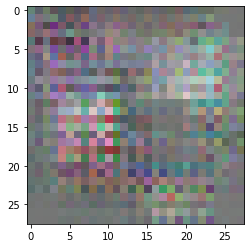

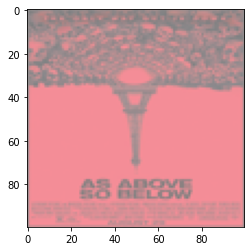

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 151, step 75000: Generator loss: 1.726618748247623, discriminator loss: 0.4625896205902099


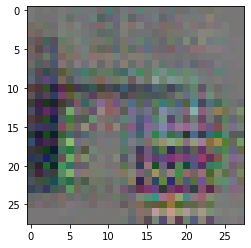

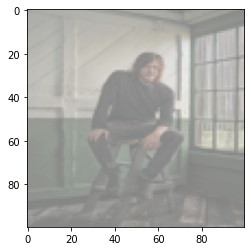

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 152, step 75500: Generator loss: 1.8723897907733922, discriminator loss: 0.3454548497349023


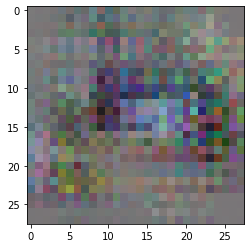

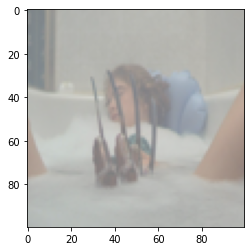

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 153, step 76000: Generator loss: 1.8875249621868126, discriminator loss: 0.3397308926582335


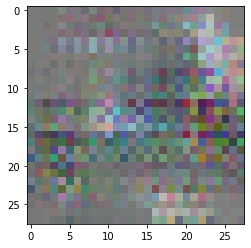

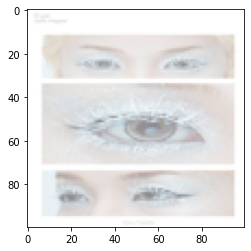

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 154, step 76500: Generator loss: 1.9930994820594776, discriminator loss: 0.32620673575997355


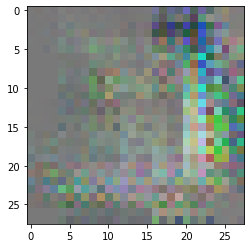

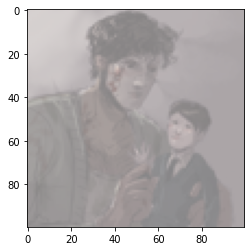

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 155, step 77000: Generator loss: 1.9897495602965354, discriminator loss: 0.34741626045107904


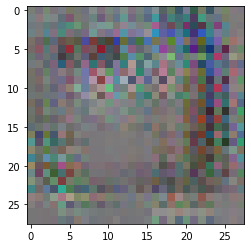

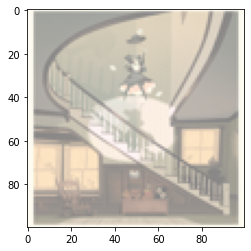

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 156, step 77500: Generator loss: 2.1526137331724176, discriminator loss: 0.32674893981218345


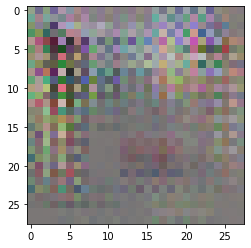

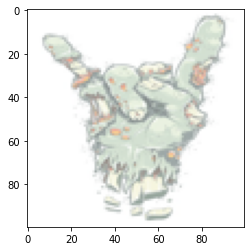

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 157, step 78000: Generator loss: 2.144564509749413, discriminator loss: 0.26709267237782475


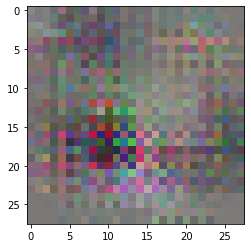

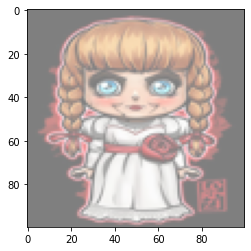

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 158, step 78500: Generator loss: 2.238994230806826, discriminator loss: 0.3301049829870462


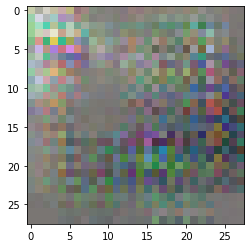

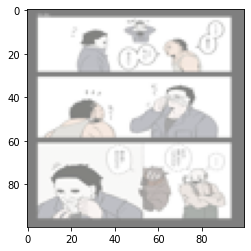

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 159, step 79000: Generator loss: 2.0799079666137703, discriminator loss: 0.3728151040971275


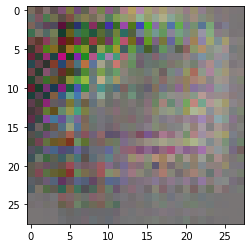

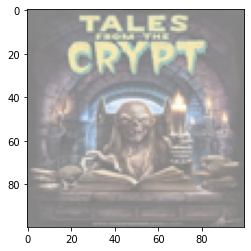

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 160, step 79500: Generator loss: 2.146078433513641, discriminator loss: 0.3546083219498398


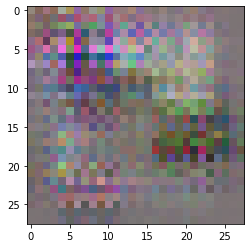

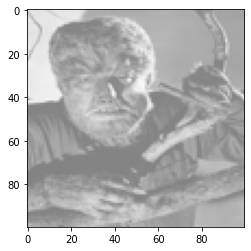

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 161, step 80000: Generator loss: 2.2457456824779483, discriminator loss: 0.28966642844676965


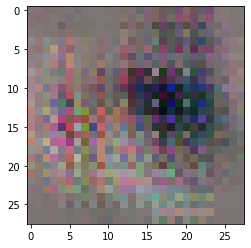

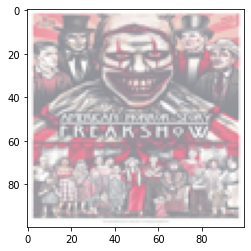

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 162, step 80500: Generator loss: 2.0029600263833993, discriminator loss: 0.3309291234612467


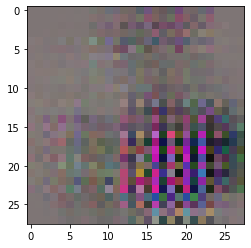

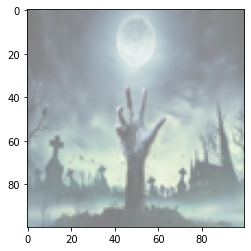

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 163, step 81000: Generator loss: 2.182427419185637, discriminator loss: 0.3493417766839266


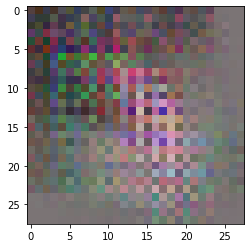

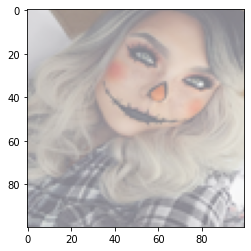

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 164, step 81500: Generator loss: 1.8600738627910616, discriminator loss: 0.4049640548974279


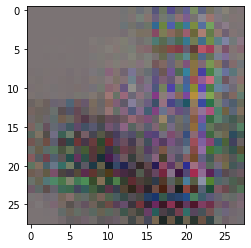

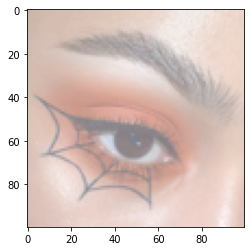

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 165, step 82000: Generator loss: 1.9261135300397891, discriminator loss: 0.3463450018912553


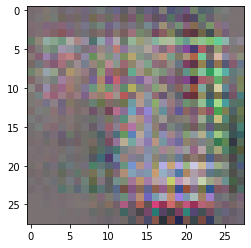

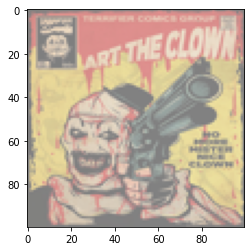

  0%|          | 0/494 [00:00<?, ?it/s]

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 167, step 82500: Generator loss: 2.226898918986319, discriminator loss: 0.25513070152699946


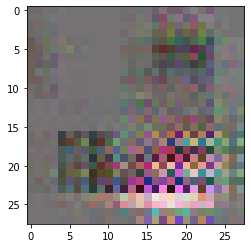

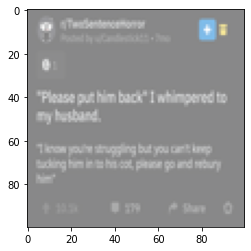

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 168, step 83000: Generator loss: 2.4133088124990474, discriminator loss: 0.33390013757348064


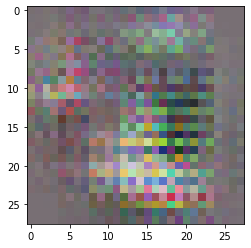

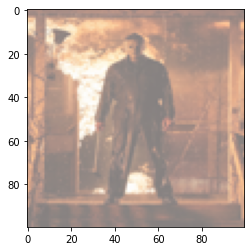

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 169, step 83500: Generator loss: 2.1365849224925046, discriminator loss: 0.3635454856008287


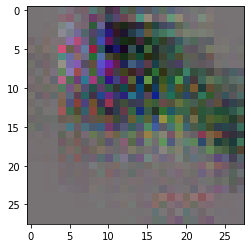

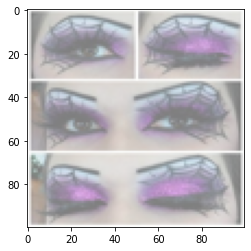

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 170, step 84000: Generator loss: 1.8853562474250802, discriminator loss: 0.33050076691806296


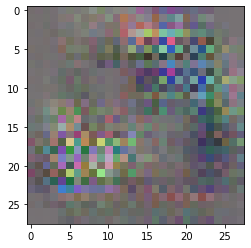

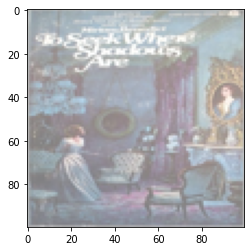

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 171, step 84500: Generator loss: 2.0138715293407436, discriminator loss: 0.3662750697433951


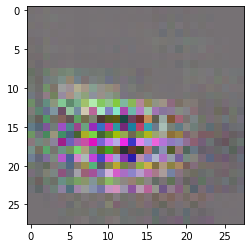

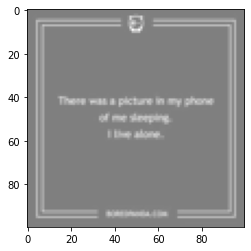

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 172, step 85000: Generator loss: 2.123491828203199, discriminator loss: 0.3871324077993632


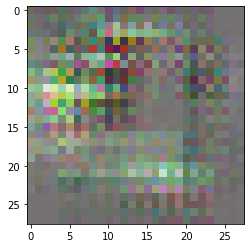

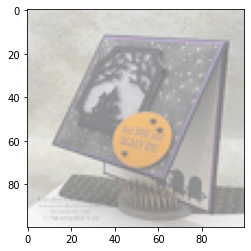

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 173, step 85500: Generator loss: 2.0461453403234486, discriminator loss: 0.34230100378394146


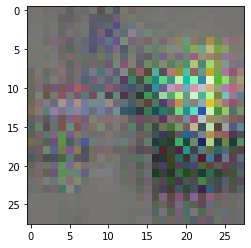

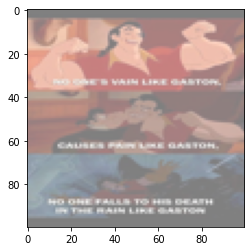

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 174, step 86000: Generator loss: 1.9908742636442176, discriminator loss: 0.33828673316538366


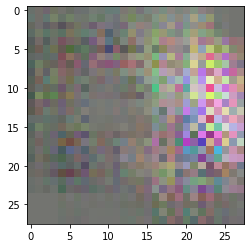

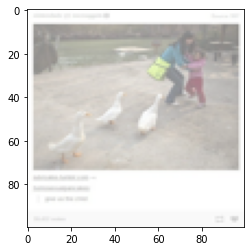

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 175, step 86500: Generator loss: 2.1679398192167296, discriminator loss: 0.2730645035356284


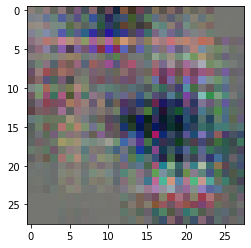

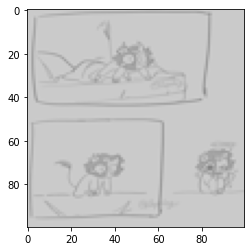

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 176, step 87000: Generator loss: 2.1533755669593813, discriminator loss: 0.3531379026100039


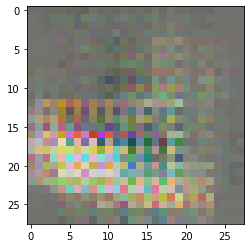

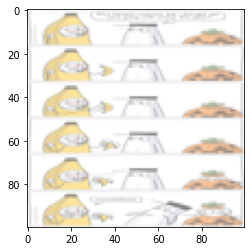

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 177, step 87500: Generator loss: 2.18222081285715, discriminator loss: 0.28332742087543006


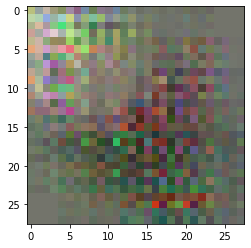

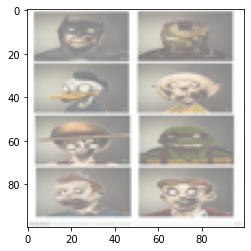

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 178, step 88000: Generator loss: 2.3857048526406297, discriminator loss: 0.29407926078885815


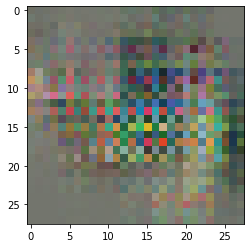

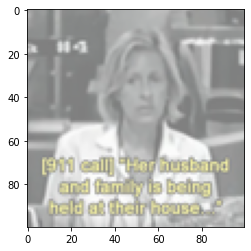

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 179, step 88500: Generator loss: 2.307022255659105, discriminator loss: 0.31096041400730595


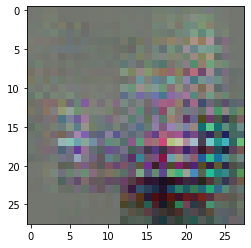

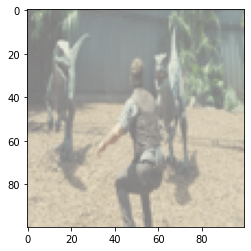

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 180, step 89000: Generator loss: 2.0594096502065664, discriminator loss: 0.3215502116084098


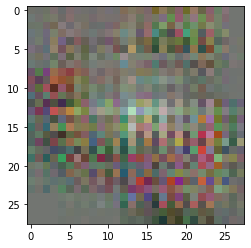

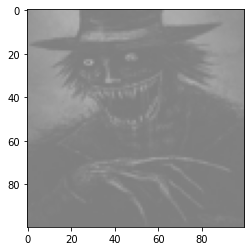

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 181, step 89500: Generator loss: 1.9359615924358402, discriminator loss: 0.4411346549689768


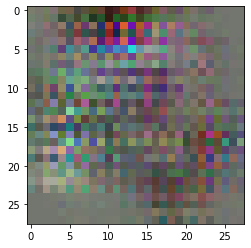

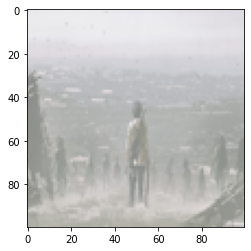

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 182, step 90000: Generator loss: 2.013449429869653, discriminator loss: 0.3802706983089446


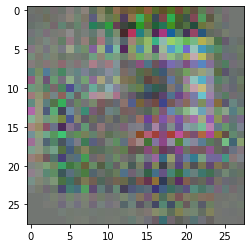

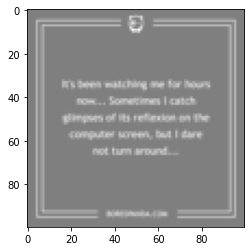

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 183, step 90500: Generator loss: 2.2024061012268055, discriminator loss: 0.2998996786624193


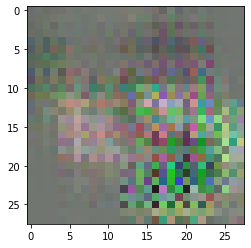

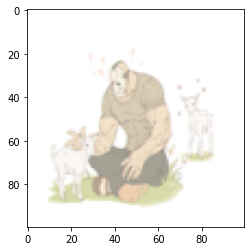

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 184, step 91000: Generator loss: 2.229011202335359, discriminator loss: 0.29368090251088136


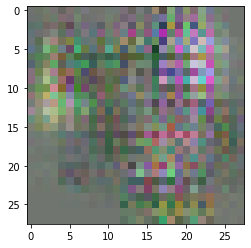

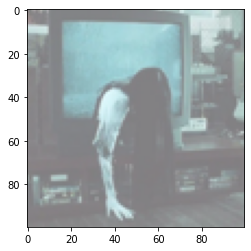

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 185, step 91500: Generator loss: 2.2200015553236025, discriminator loss: 0.33970476317405707


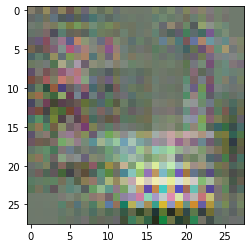

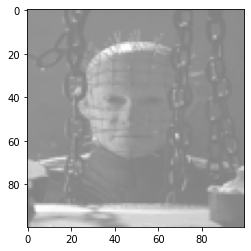

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 186, step 92000: Generator loss: 2.20823956668377, discriminator loss: 0.3318157878518106


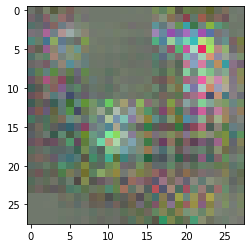

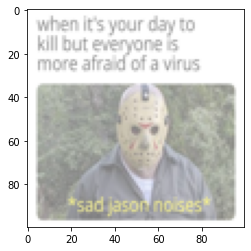

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 187, step 92500: Generator loss: 2.168858940362932, discriminator loss: 0.3898314232975247


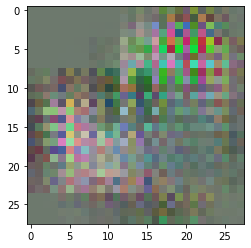

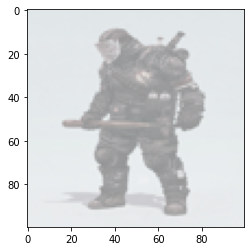

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 188, step 93000: Generator loss: 2.280503168940548, discriminator loss: 0.3282852633967998


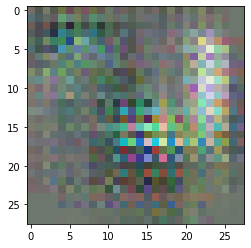

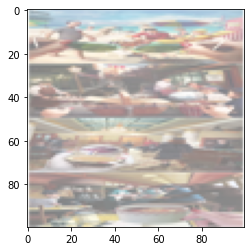

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 189, step 93500: Generator loss: 2.087998623132708, discriminator loss: 0.35449223898351184


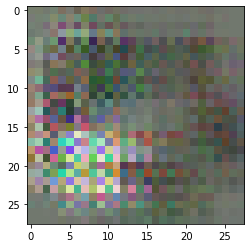

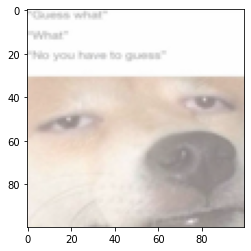

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 190, step 94000: Generator loss: 2.3552607038021094, discriminator loss: 0.3108904849737883


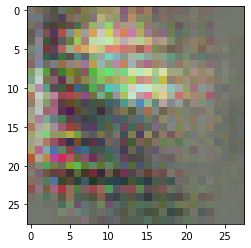

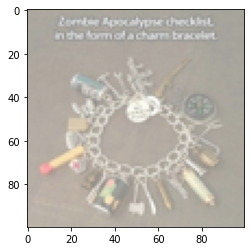

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 191, step 94500: Generator loss: 2.345669837296008, discriminator loss: 0.37521459364891036


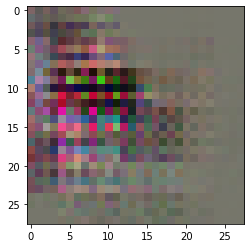

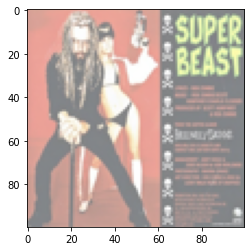

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 192, step 95000: Generator loss: 1.8466446343660368, discriminator loss: 0.45638285830616954


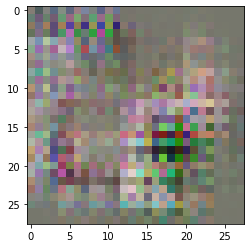

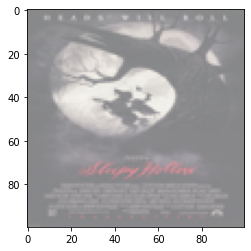

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 193, step 95500: Generator loss: 1.8892239445149908, discriminator loss: 0.4122622565478094


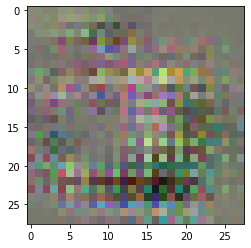

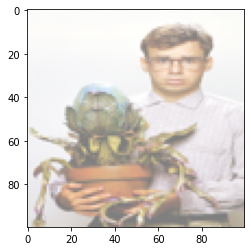

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 194, step 96000: Generator loss: 2.048816020280123, discriminator loss: 0.44560369259119026


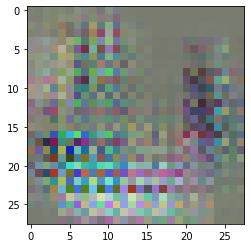

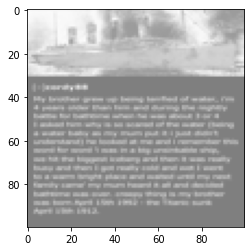

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 195, step 96500: Generator loss: 2.1745065269470185, discriminator loss: 0.3591729754135011


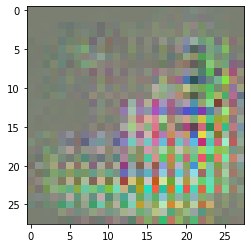

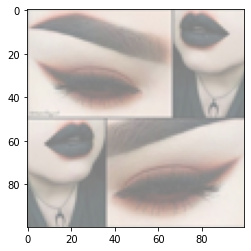

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 196, step 97000: Generator loss: 2.0159655327796933, discriminator loss: 0.42248889765143394


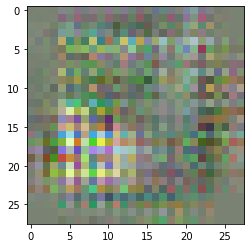

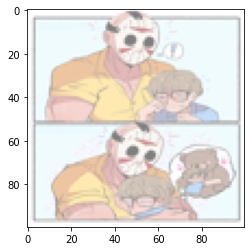

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 197, step 97500: Generator loss: 1.8251055055856702, discriminator loss: 0.5480758895576003


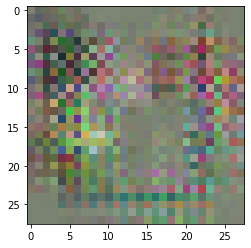

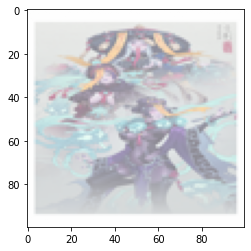

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 198, step 98000: Generator loss: 1.710344150185584, discriminator loss: 0.49406086876988387


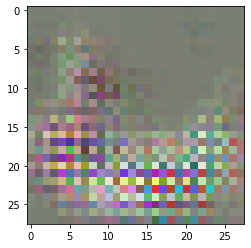

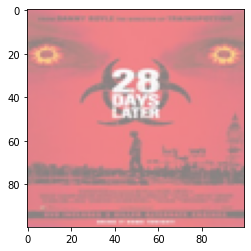

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 199, step 98500: Generator loss: 1.885423331975936, discriminator loss: 0.4043116230219608


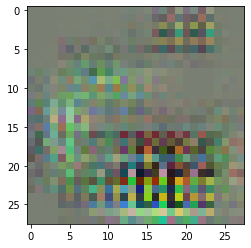

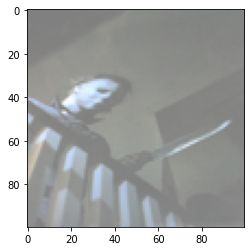

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 200, step 99000: Generator loss: 1.9089396303892143, discriminator loss: 0.3802985112369064


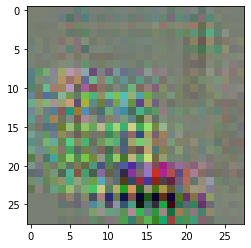

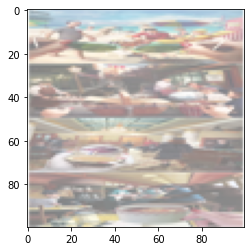

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 201, step 99500: Generator loss: 1.912374035418034, discriminator loss: 0.4393264106512067


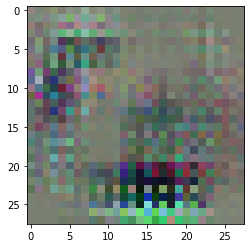

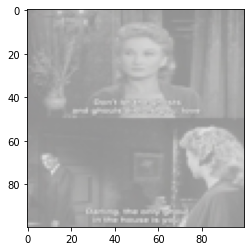

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 202, step 100000: Generator loss: 1.768034031033516, discriminator loss: 0.44096117292344544


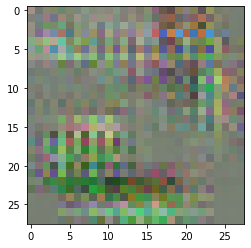

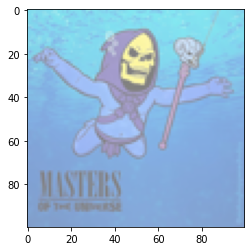

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 203, step 100500: Generator loss: 1.8634713064432127, discriminator loss: 0.47282112693786627


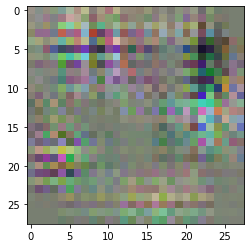

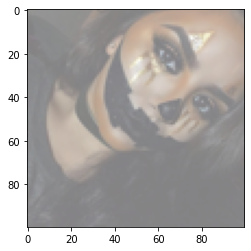

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 204, step 101000: Generator loss: 1.760103360533714, discriminator loss: 0.4430751873552798


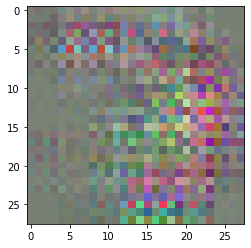

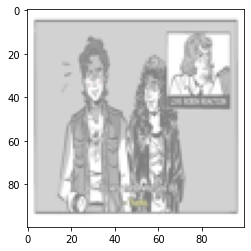

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 205, step 101500: Generator loss: 1.9407882525026814, discriminator loss: 0.4275248081833125


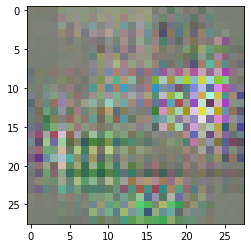

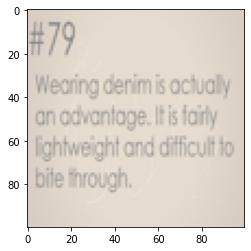

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 206, step 102000: Generator loss: 2.0643557619750488, discriminator loss: 0.4032206293791533


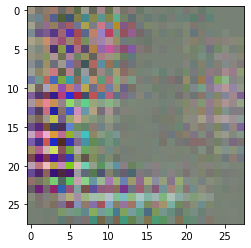

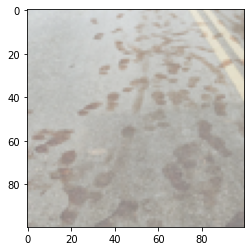

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 207, step 102500: Generator loss: 2.1281156247556217, discriminator loss: 0.44213604907691473


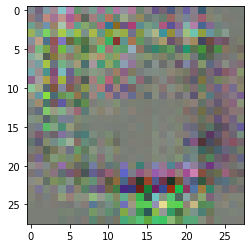

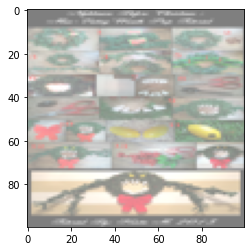

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 208, step 103000: Generator loss: 1.8422126851081866, discriminator loss: 0.3921476742327212


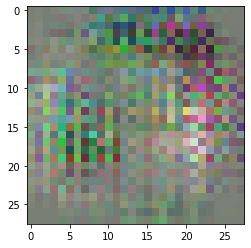

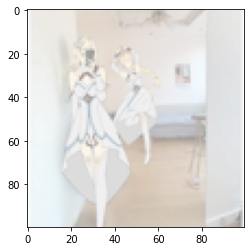

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 209, step 103500: Generator loss: 1.9758574760556233, discriminator loss: 0.4532485654205088


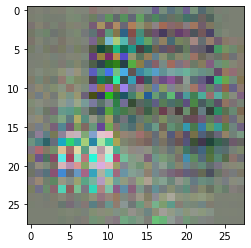

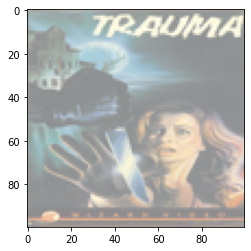

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 210, step 104000: Generator loss: 1.99257385420799, discriminator loss: 0.3959104429781437


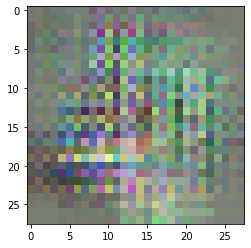

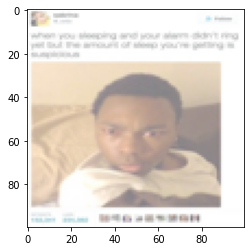

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 211, step 104500: Generator loss: 1.8713580467700959, discriminator loss: 0.3939386443495752


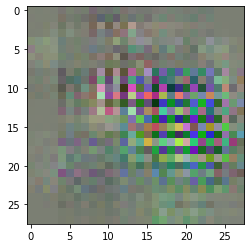

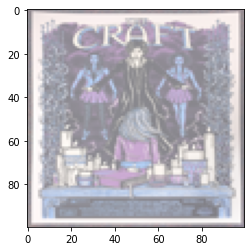

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 212, step 105000: Generator loss: 1.9978969835639007, discriminator loss: 0.42507333870232095


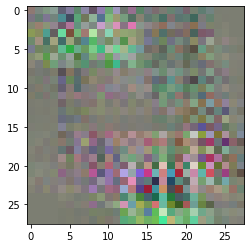

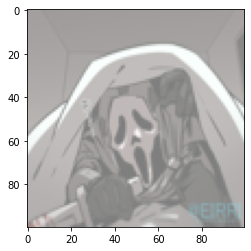

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 213, step 105500: Generator loss: 1.935747802138329, discriminator loss: 0.3878050994277002


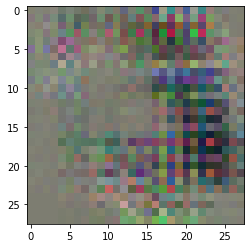

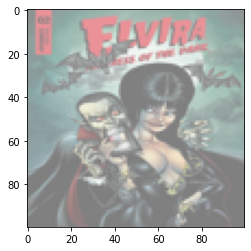

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 214, step 106000: Generator loss: 1.8792801730632784, discriminator loss: 0.4151254443526267


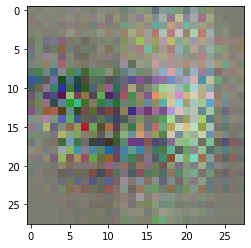

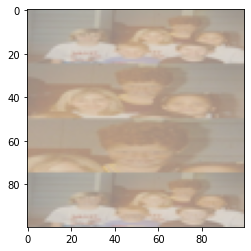

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 215, step 106500: Generator loss: 1.9391395405530938, discriminator loss: 0.4634209860414267


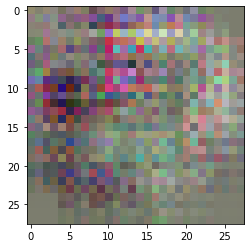

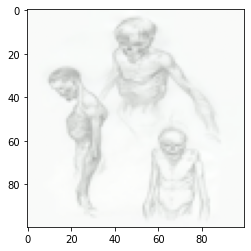

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 216, step 107000: Generator loss: 2.123834258198738, discriminator loss: 0.3524994069486856


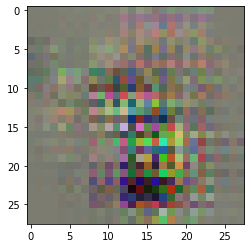

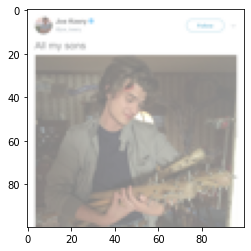

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 217, step 107500: Generator loss: 1.9872538461685187, discriminator loss: 0.4279278324842457


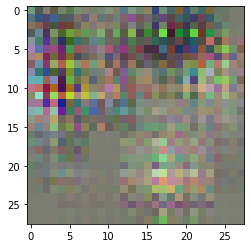

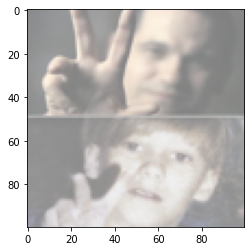

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 218, step 108000: Generator loss: 2.01654539978504, discriminator loss: 0.36366298410296466


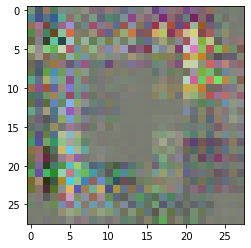

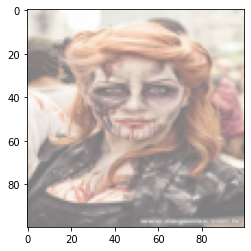

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 219, step 108500: Generator loss: 2.036102739334105, discriminator loss: 0.42108720186352705


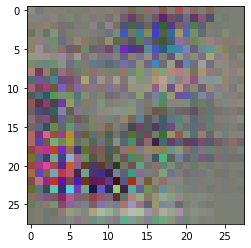

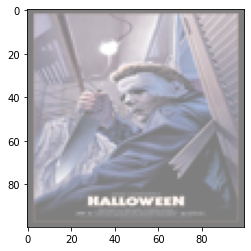

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 220, step 109000: Generator loss: 2.0597908093333226, discriminator loss: 0.3992111861556765


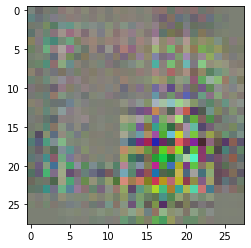

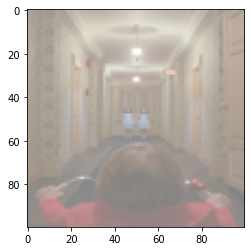

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 221, step 109500: Generator loss: 2.2022565115392214, discriminator loss: 0.3670923462137582


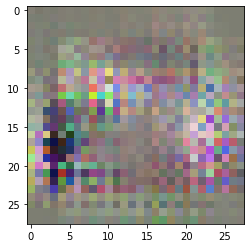

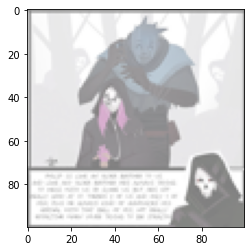

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 222, step 110000: Generator loss: 1.900989734947684, discriminator loss: 0.38598347026109725


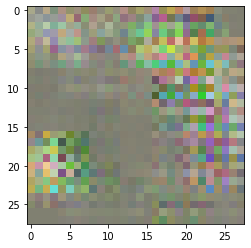

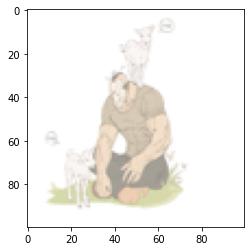

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 223, step 110500: Generator loss: 2.0534151066839685, discriminator loss: 0.42922090187668827


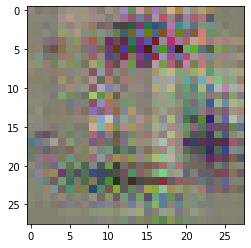

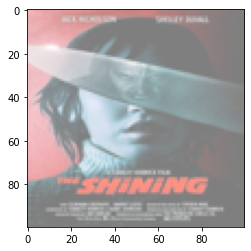

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 224, step 111000: Generator loss: 1.9319732415080078, discriminator loss: 0.34208733302354777


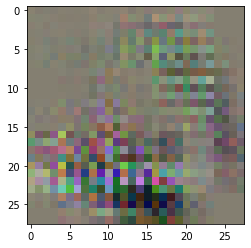

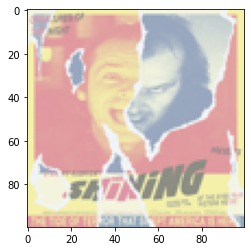

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 225, step 111500: Generator loss: 2.285482104569673, discriminator loss: 0.427028434239328


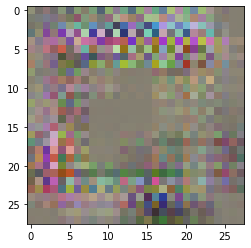

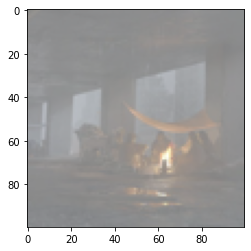

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 226, step 112000: Generator loss: 2.250116083025933, discriminator loss: 0.35286076008528505


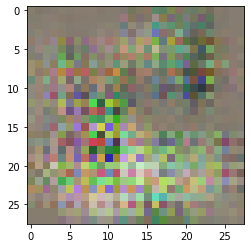

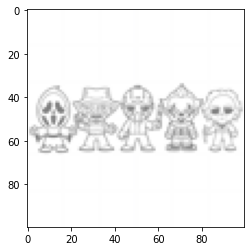

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 227, step 112500: Generator loss: 2.095450333356857, discriminator loss: 0.32371316204965167


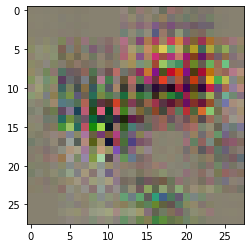

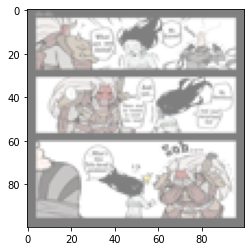

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 228, step 113000: Generator loss: 2.1969779050052174, discriminator loss: 0.4053392580971122


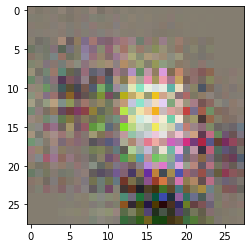

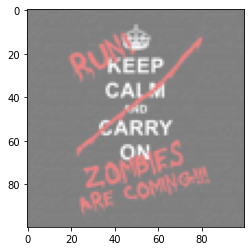

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 229, step 113500: Generator loss: 2.2026118951737867, discriminator loss: 0.4475015276372433


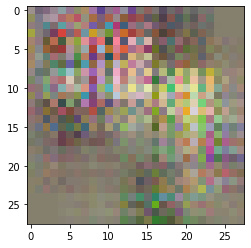

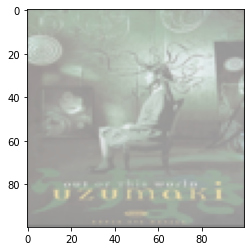

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 230, step 114000: Generator loss: 1.916942586004734, discriminator loss: 0.4325565463304519


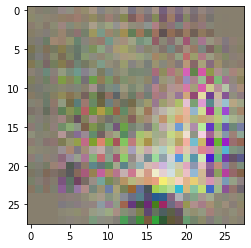

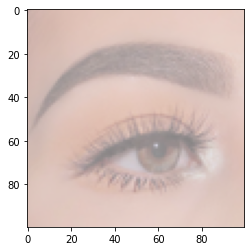

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 231, step 114500: Generator loss: 1.9732007136940948, discriminator loss: 0.5151537836939099


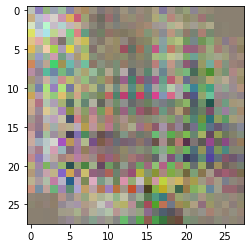

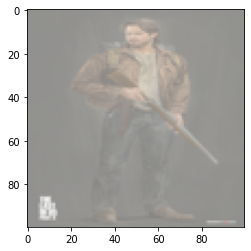

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 232, step 115000: Generator loss: 2.1160000080019237, discriminator loss: 0.4283265914022919


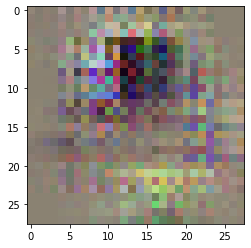

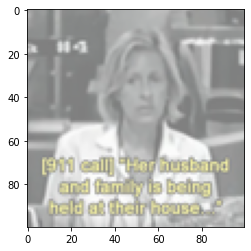

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 233, step 115500: Generator loss: 1.8880393639206896, discriminator loss: 0.4503387874364849


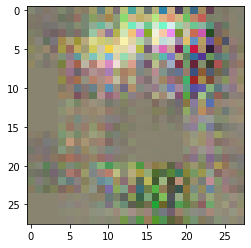

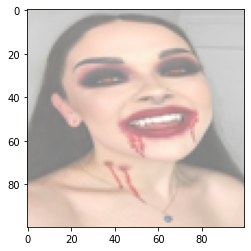

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 234, step 116000: Generator loss: 2.0702406356856224, discriminator loss: 0.5636585237830878


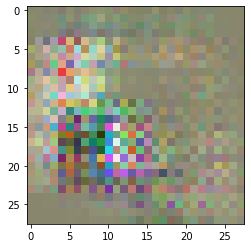

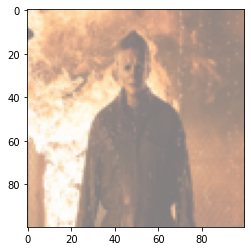

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 235, step 116500: Generator loss: 2.000908112656326, discriminator loss: 0.6096902486681935


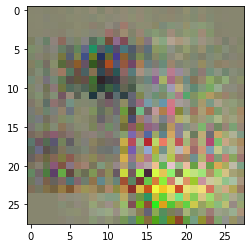

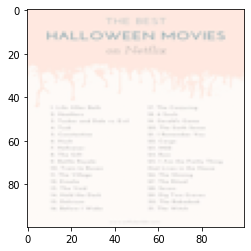

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 236, step 117000: Generator loss: 1.6348961441218839, discriminator loss: 0.6481181107759479


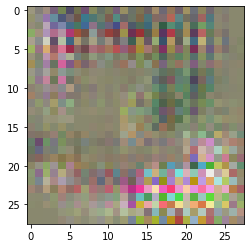

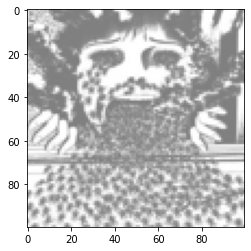

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 237, step 117500: Generator loss: 1.956782897025345, discriminator loss: 0.6139914604425426


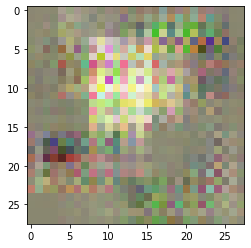

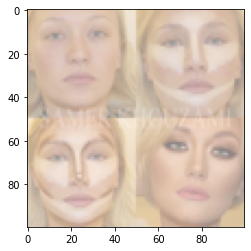

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 238, step 118000: Generator loss: 1.5381152349114409, discriminator loss: 0.5981289196014408


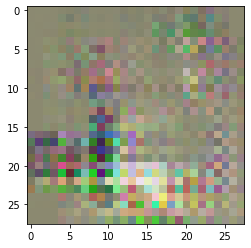

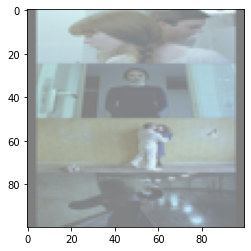

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 239, step 118500: Generator loss: 1.6899005147218702, discriminator loss: 0.5768252751529213


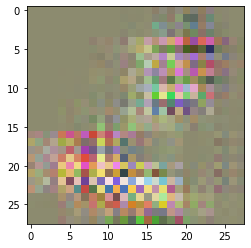

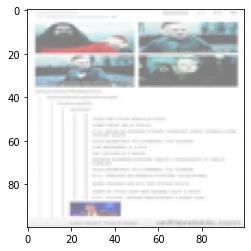

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 240, step 119000: Generator loss: 1.7653622443526982, discriminator loss: 0.5600676159262651


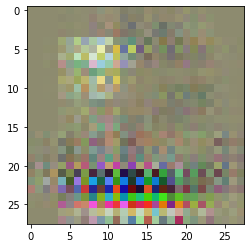

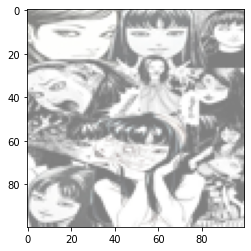

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 241, step 119500: Generator loss: 1.6457879069447523, discriminator loss: 0.7398949030339721


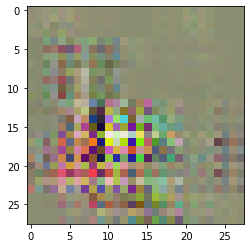

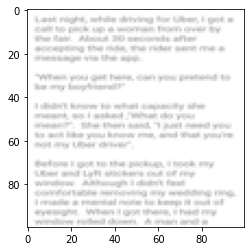

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 242, step 120000: Generator loss: 1.6065924717485893, discriminator loss: 0.71491705006361


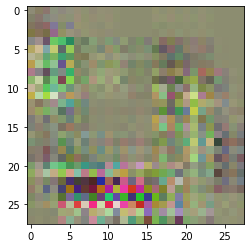

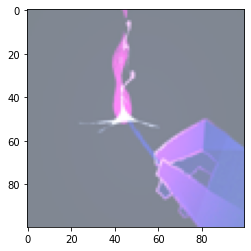

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 243, step 120500: Generator loss: 1.4543486102223413, discriminator loss: 0.7710811002254481


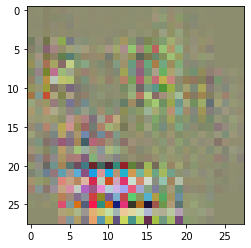

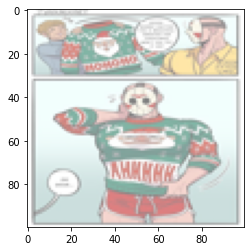

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 244, step 121000: Generator loss: 1.2681456248164176, discriminator loss: 0.6684832759499549


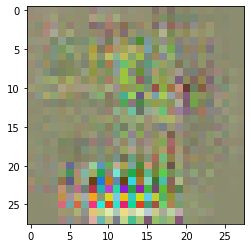

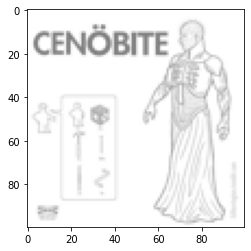

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 245, step 121500: Generator loss: 1.0994934920966624, discriminator loss: 0.808151969075202


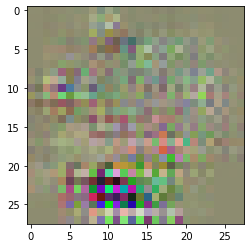

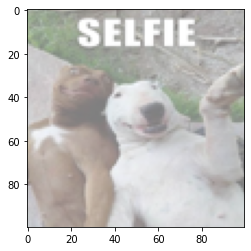

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 246, step 122000: Generator loss: 1.0302133237421511, discriminator loss: 0.8381923307776453


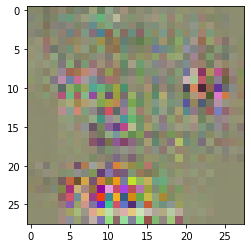

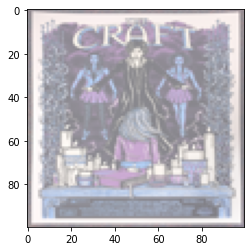

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 247, step 122500: Generator loss: 0.9899648578763014, discriminator loss: 1.039635243296623


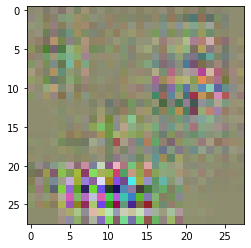

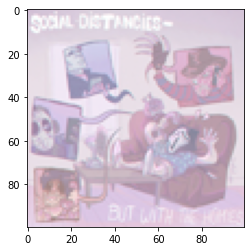

  0%|          | 0/494 [00:00<?, ?it/s]

Epoch 248, step 123000: Generator loss: 1.1220833016633989, discriminator loss: 0.9453749262094502


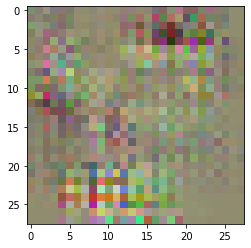

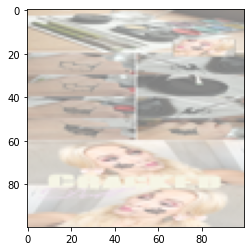

  0%|          | 0/494 [00:00<?, ?it/s]

In [165]:
n_epochs = 250
cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
for epoch in range(n_epochs):
    # Dataloader returns the batches
    for real in tqdm(dataloader):
        cur_batch_size = len(real)
        real = real.to(device)

        ## Update discriminator ##
        disc_opt.zero_grad()
        fake_noise = get_noise(cur_batch_size, z_dim, device=device)
        fake = gen(fake_noise)
        disc_fake_pred = disc(fake.detach())
        disc_fake_loss = criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred))
        disc_real_pred = disc(real)
        disc_real_loss = criterion(disc_real_pred, torch.ones_like(disc_real_pred))
        disc_loss = (disc_fake_loss + disc_real_loss) / 2

        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss.item() / display_step
        # Update gradients
        disc_loss.backward(retain_graph=True)
        # Update optimizer
        disc_opt.step()

        ## Update generator ##
        gen_opt.zero_grad()
        fake_noise_2 = get_noise(cur_batch_size, z_dim, device=device)
        fake_2 = gen(fake_noise_2)
        disc_fake_pred = disc(fake_2)
        gen_loss = criterion(disc_fake_pred, torch.ones_like(disc_fake_pred))
        gen_loss.backward()
        gen_opt.step()

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() / display_step

        ## Visualization code ##
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Epoch {epoch}, step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1
